# Car Detection

Menggunakan dataset dari Kaggle https://www.kaggle.com/datasets/abdallahwagih/cars-detection/data, yang memiliki jumlah gambar sebanyak 2.509 data yang terdiri dari 3 sub folder di dalamnya yaitu :

- train : 878
- valid : 250
- test : 126

terbagi menjadi 5 class :
0 : 'Ambulance',
1 : 'Bus',
2 : 'Car',
3 : 'Motorcycle',
4 : 'Truck'.

file gambar tersebut di simpan ke dalam google drive



*   Menggunakan ultralytics
*   Menggunakan model YOLOv8



# Import Library

In [1]:
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


In [2]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 17.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 123.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 89.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 61.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 43.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 20.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 97.3 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstallin

In [6]:
# Cell 2: Import dependencies
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cv2
from tqdm.notebook import tqdm
import torch
from torch.utils.data import Dataset, DataLoader
from ultralytics import YOLO
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix, ConfusionMatrixDisplay
import seaborn as sns
from PIL import Image, ImageDraw, ImageFont
from tabulate import tabulate
import collections
from collections import Counter


# Data Exploration

In [7]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [8]:
# Set the path to the dataset directory
dataset_path = '/content/drive/MyDrive/Car_Detection'  # Replace with your actual dataset path

# Set paths for training and validation image sets
train_images_path = os.path.join(dataset_path, 'train', 'images')
valid_images_path = os.path.join(dataset_path, 'valid', 'images')
test_images_path = os.path.join(dataset_path, 'test', 'images')

In [14]:
# Initialize counters for the number of images
num_train_images = 0
num_valid_images = 0
num_test_images = 0

# Initialize sets to hold the unique sizes of images
train_image_sizes = set()
valid_image_sizes = set()
test_image_sizes = set()

# Check train images sizes and count
for filename in os.listdir(train_images_path):
    if filename.endswith(('.jpg', '.png', '.jpeg')):
        num_train_images += 1
        image_path = os.path.join(train_images_path, filename)
        with Image.open(image_path) as img:
            train_image_sizes.add(img.size)

# Check validation images sizes and count
for filename in os.listdir(valid_images_path):
    if filename.endswith(('.jpg', '.png', '.jpeg')):
        num_valid_images += 1
        image_path = os.path.join(valid_images_path, filename)
        with Image.open(image_path) as img:
            valid_image_sizes.add(img.size)

# Check test images sizes and count
for filename in os.listdir(test_images_path):
    if filename.endswith(('.jpg', '.png', '.jpeg')):
        num_test_images += 1
        image_path = os.path.join(test_images_path, filename)
        with Image.open(image_path) as img:
            test_image_sizes.add(img.size)

# Print the results
print(f"Number of training images: {num_train_images}")
print(f"Number of validation images: {num_valid_images}")
print(f"Number of test images: {num_test_images}")

# Check if all images in training set have the same size
if len(train_image_sizes) == 1:
    print(f"All training images have the same size: {train_image_sizes.pop()}")
else:
    print("Training images have varying sizes.")

# Check if all images in validation set have the same size
if len(valid_image_sizes) == 1:
    print(f"All validation images have the same size: {valid_image_sizes.pop()}")
else:
    print("Validation images have varying sizes.")


# Check if all images in test set have the same size
if len(test_image_sizes) == 1:
    print(f"All test images have the same size: {test_image_sizes.pop()}")
else:
    print("Test images have varying sizes.")

Number of training images: 878
Number of validation images: 250
Number of test images: 126
All training images have the same size: (416, 416)
All validation images have the same size: (416, 416)
All test images have the same size: (416, 416)


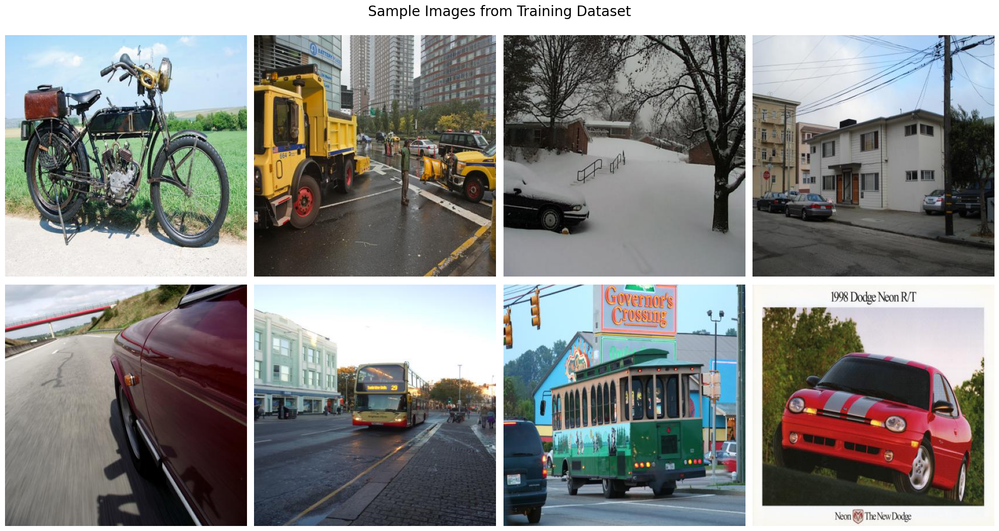

In [9]:
# List all jpg, png, and jpeg images in the directory
image_files = [file for file in os.listdir(train_images_path) if file.endswith(('.jpg', '.png', '.jpeg'))]

# Select 8 images at equal intervals
num_images = len(image_files)
selected_images = [image_files[i] for i in range(0, num_images, num_images // 8)]

# Create a 2x4 subplot
fig, axes = plt.subplots(2, 4, figsize=(20, 11))

# Display each of the selected images
for ax, img_file in zip(axes.ravel(), selected_images):
    img_path = os.path.join(train_images_path, img_file)
    image = Image.open(img_path)
    ax.imshow(image)
    ax.axis('off')

plt.suptitle('Sample Images from Training Dataset', fontsize=20)
plt.tight_layout()
plt.show()

# Load Dataset

In [22]:
# Cell 3: Basic configurations
BATCH_SIZE = 64
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {DEVICE}")

# Class names to numeric class IDs mapping
class_mapping = {
    'Ambulance': 0,
    'Bus': 1,
    'Car': 2,
    'Motorcycle': 3,
    'Truck': 4
}

Using device: cuda


In [23]:
# Cell 4: Custom dataset for YOLOv8 format
class CarDataset(Dataset):
    def __init__(self, img_dir, label_dir, transform=None):
        self.img_dir = img_dir
        self.label_dir = label_dir
        self.transform = transform
        self.image_files = sorted([f for f in os.listdir(img_dir) if f.endswith(('.jpg', '.jpeg', '.png'))])

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_name = self.image_files[idx]
        img_path = os.path.join(self.img_dir, img_name)

        # Get corresponding label file (assuming same name with .txt extension)
        label_name = os.path.splitext(img_name)[0] + '.txt'
        label_path = os.path.join(self.label_dir, label_name)

        # Read image
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Get original dimensions
        height, width = image.shape[:2]

        # Apply transforms if any
        if self.transform:
            image = self.transform(image)

        # Read labels (YOLOv8 format)
        boxes = []
        classes = []

        if os.path.exists(label_path):
            with open(label_path, 'r', encoding='utf-8-sig') as f:
                for line in f.read().strip().split('\n'):
                    if line.strip():
                        data = line.strip().split()
                        class_id = int(data[0])

                        # Map YOLO class IDs to our 0-indexed classes
                        # The original code has a class_id_to_index mapping
                        if class_id in [1, 2, 3, 4, 5]:
                            mapped_class_id = class_id  # Convert 1-5 to 0-4

                            # YOLO format: class x_center y_center width height
                            x_center = float(data[1])
                            y_center = float(data[2])
                            w = float(data[3])
                            h = float(data[4])

                            # Convert to xmin, ymin, xmax, ymax format
                            xmin = int((x_center - w/2) * width)
                            ymin = int((y_center - h/2) * height)
                            xmax = int((x_center + w/2) * width)
                            ymax = int((y_center + h/2) * height)

                            boxes.append([xmin, ymin, xmax, ymax])
                            classes.append(mapped_class_id)

        # Return image path, image, boxes, and classes
        return {
            'image_path': img_path,
            'image': image,
            'height': height,
            'width': width,
            'boxes': torch.tensor(boxes, dtype=torch.float32) if boxes else torch.zeros((0, 4), dtype=torch.float32),
            'classes': torch.tensor(classes, dtype=torch.long) if classes else torch.zeros(0, dtype=torch.long)
        }


In [24]:
# Cell 5: Create data paths and visualization functions
def create_dataset_paths():
    train_img_dir = '/content/drive/MyDrive/Car_Detection/train/images'
    train_label_dir = '/content/drive/MyDrive/Car_Detection/train/labels'

    valid_img_dir = '/content/drive/MyDrive/Car_Detection/valid/images'
    valid_label_dir = '/content/drive/MyDrive/Car_Detection/valid/labels'

    test_img_dir = '/content/drive/MyDrive/Car_Detection/test/images'
    test_label_dir = '/content/drive/MyDrive/Car_Detection/test/labels'

    return {
        'train': (train_img_dir, train_label_dir),
        'valid': (valid_img_dir, valid_label_dir),
        'test': (test_img_dir, test_label_dir)
    }

# Function to visualize images with bounding boxes
def visualize_dataset(dataset, num_samples=4, figsize=(12, 12)):
    fig, axes = plt.subplots(2, 2, figsize=figsize)
    axes = axes.flatten()

    # Get random samples
    indices = np.random.choice(len(dataset), min(num_samples, len(dataset)), replace=False)

    for i, idx in enumerate(indices):
        if i >= num_samples:
            break

        sample = dataset[idx]
        img = sample['image']
        boxes = sample['boxes'].numpy()
        classes = sample['classes'].numpy()

        # Display image
        axes[i].imshow(img)

        # Draw bounding boxes
        for box, cls in zip(boxes, classes):
            xmin, ymin, xmax, ymax = box
            rect = plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                               fill=False, edgecolor='red', linewidth=2)
            axes[i].add_patch(rect)

            # Add class label
            axes[i].text(xmin, ymin - 5, class_mapping[cls],
                      color='red', fontsize=12,
                      bbox=dict(facecolor='white', alpha=0.7))

        axes[i].set_title(f"Sample {idx}")
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()

# Preprocessing

In [25]:
# Cell 6: Data preparation
def prepare_datasets():
    paths = create_dataset_paths()

    # Create datasets
    train_dataset = CarDataset(paths['train'][0], paths['train'][1])
    valid_dataset = CarDataset(paths['valid'][0], paths['valid'][1])
    test_dataset = carDataset(paths['test'][0], paths['test'][1])

    print(f"Train dataset size: {len(train_dataset)}")
    print(f"Validation dataset size: {len(valid_dataset)}")
    print(f"Test dataset size: {len(test_dataset)}")

    # Visualize some samples from training data
    visualize_dataset(train_dataset)

    return train_dataset, valid_dataset, test_dataset

Train dataset size: 878
Validation dataset size: 250
Test dataset size: 126


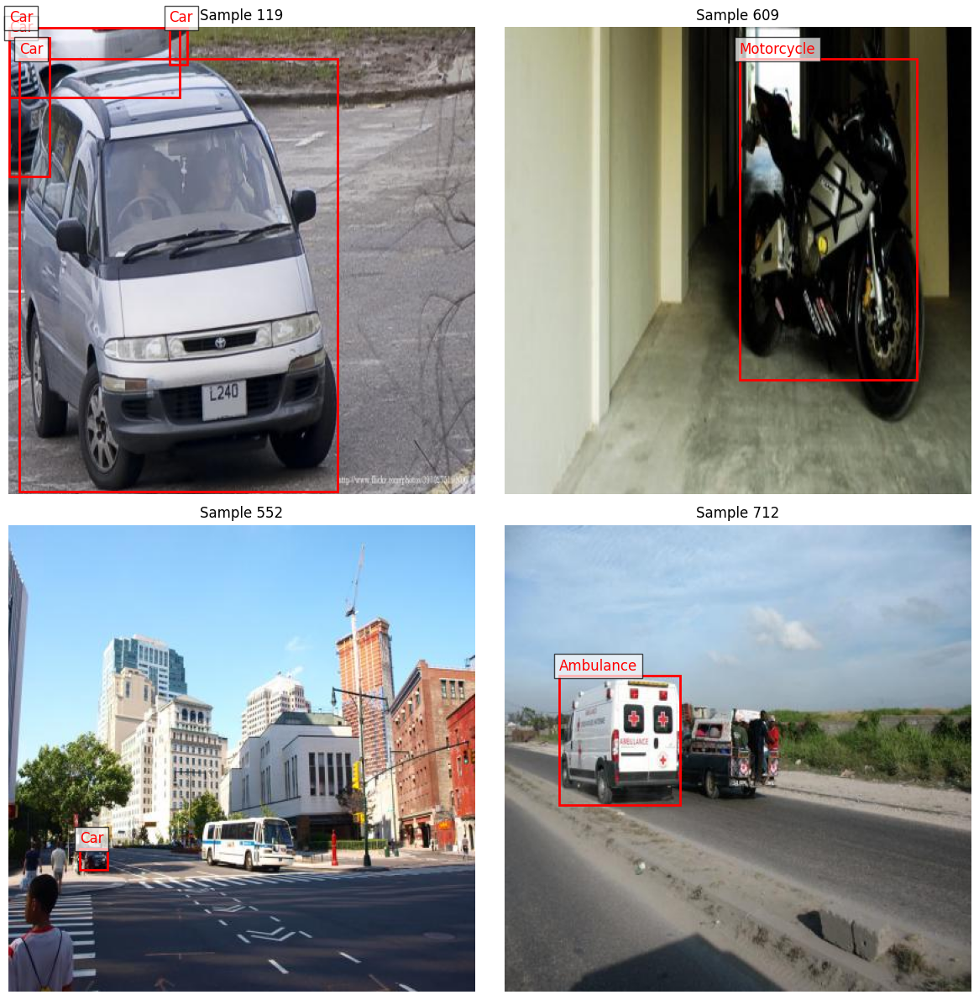

In [26]:
train_dataset, valid_dataset, test_dataset = prepare_datasets()

Counting classes:   0%|          | 0/878 [00:00<?, ?it/s]

Counting classes:   0%|          | 0/250 [00:00<?, ?it/s]

Counting classes:   0%|          | 0/126 [00:00<?, ?it/s]

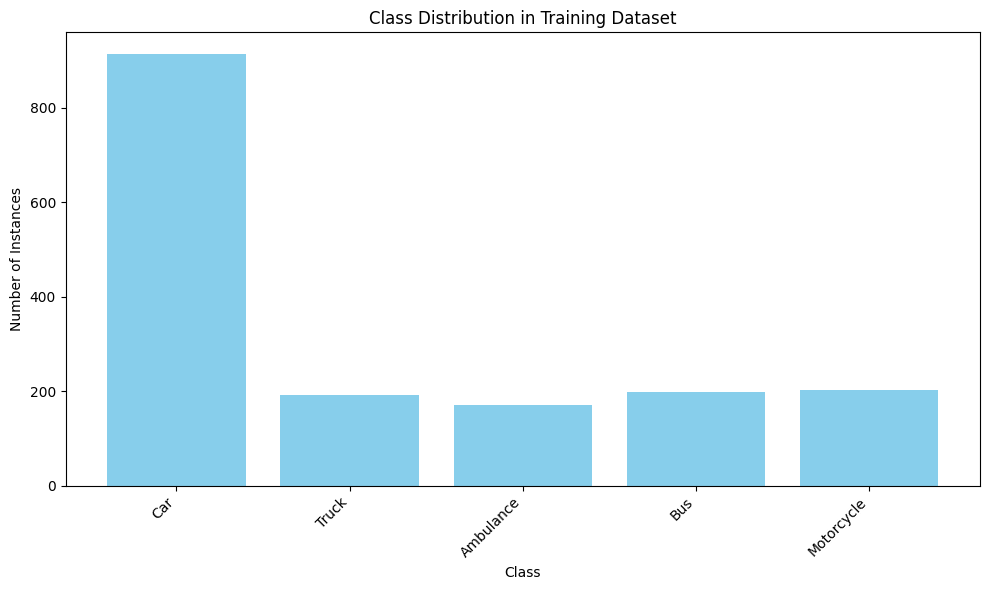

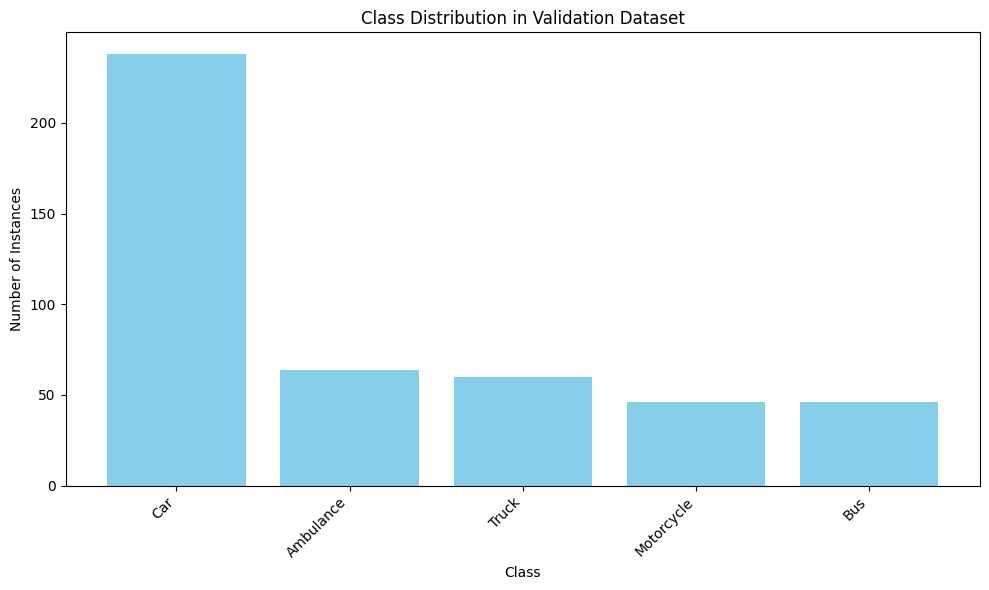

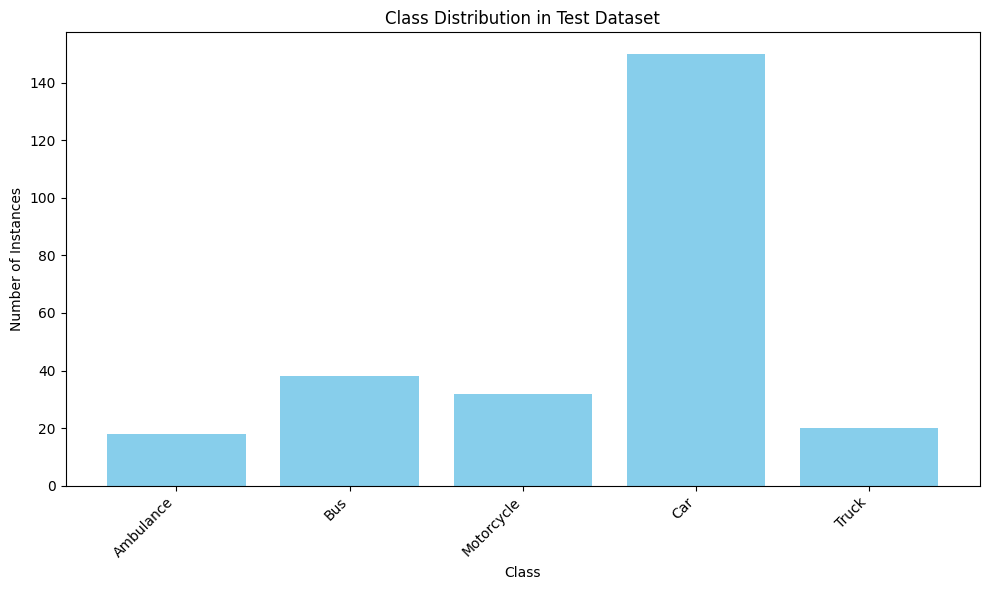

In [60]:
# prompt: histogram masing masing dari class class_mapping = {
#     0: 'Ambulance',
#     1: 'Bus',
#     2: 'Car',
#     3: 'Motorcycle',
#     4: 'Truck'
# } untuk data train, valid, dan test

import matplotlib.pyplot as plt
def get_class_counts(dataset, class_mapping):
    """
    Counts the occurrences of each class in a dataset.

    Args:
        dataset (CarDataset): The dataset object.
        class_mapping (dict): A dictionary mapping class IDs to class names.

    Returns:
        dict: A dictionary with class names as keys and their counts as values.
    """
    class_counts = collections.Counter()
    for i in tqdm(range(len(dataset)), desc="Counting classes"):
        sample = dataset[i]
        classes = sample['classes'].tolist() # Convert tensor to list
        class_counts.update(classes)

    # Map integer class IDs back to names for the final count dictionary
    named_class_counts = {class_mapping.get(cls_id, f"Unknown {cls_id}"): count
                          for cls_id, count in class_counts.items()}
    return named_class_counts

def plot_class_histogram(class_counts, title):
    """
    Plots a histogram of class counts.

    Args:
        class_counts (dict): A dictionary with class names as keys and counts as values.
        title (str): The title of the histogram.
    """
    if not class_counts:
        print(f"No class data to plot for {title}")
        return

    classes = list(class_counts.keys())
    counts = list(class_counts.values())

    plt.figure(figsize=(10, 6))
    plt.bar(classes, counts, color='skyblue')
    plt.xlabel("Class")
    plt.ylabel("Number of Instances")
    plt.title(title)
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

# Get class counts for each dataset
train_class_counts = get_class_counts(train_dataset, class_mapping)
valid_class_counts = get_class_counts(valid_dataset, class_mapping)
test_class_counts = get_class_counts(test_dataset, class_mapping)

# Plot histograms
plot_class_histogram(train_class_counts, "Class Distribution in Training Dataset")
plot_class_histogram(valid_class_counts, "Class Distribution in Validation Dataset")
plot_class_histogram(test_class_counts, "Class Distribution in Test Dataset")

In [19]:
# Dalam Cell 2, tambahkan import
import albumentations as A
from albumentations.pytorch import ToTensorV2 # Jika menggunakan PyTorch

# Dalam Cell 4, ubah __init__ dan __getitem__
class carDataset(Dataset):
    def __init__(self, img_dir, label_dir, transform=None):
        self.img_dir = img_dir
        self.label_dir = label_dir
        self.image_files = sorted([f for f in os.listdir(img_dir) if f.endswith(('.jpg', '.jpeg', '.png'))])

        # Define your augmentation transforms here (example)
        if transform is None:
            self.transform = A.Compose([
                A.Resize(640, 640), # Resize to model input size
                A.HorizontalFlip(p=0.5),
                A.ShiftScaleRotate(shift_limit=0.1, scale_limit=0.1, rotate_limit=15, p=0.5),
                A.RandomBrightnessContrast(p=0.5),
                A.RGBShift(p=0.5),
                A.Blur(p=0.1),
                # Add more transforms as needed
                A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)), # ImageNet stats
                ToTensorV2(),
            ], bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels'])) # Specify YOLO format for boxes
        else:
            self.transform = transform

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_name = self.image_files[idx]
        img_path = os.path.join(self.img_dir, img_name)

        label_name = os.path.splitext(img_name)[0] + '.txt'
        label_path = os.path.join(self.label_dir, label_name)

        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Read labels in YOLO format (class x_c y_c w h)
        boxes_yolo = []
        classes = []
        if os.path.exists(label_path):
            with open(label_path, 'r', encoding='utf-8-sig') as f:
                for line in f.read().strip().split('\n'):
                    if line.strip():
                        data = line.strip().split()
                        class_id = int(data[0])
                        # Assuming your YOLO labels are already 0-indexed or 1-indexed
                        # If 1-indexed, adjust here: mapped_class_id = class_id - 1
                        mapped_class_id = class_id # Adjust if your labels are 1-indexed

                        x_center = float(data[1])
                        y_center = float(data[2])
                        w = float(data[3])
                        h = float(data[4])
                        boxes_yolo.append([x_center, y_center, w, h])
                        classes.append(mapped_class_id)

        # Apply transforms (including resize, augmentations, normalize, ToTensor)
        # Albumentations requires boxes and labels to be passed together
        augmented = self.transform(image=image, bboxes=boxes_yolo, class_labels=classes)
        image = augmented['image']
        # Albumentations returns boxes in the format specified in BboxParams (here 'yolo')
        # You need to convert them back to xyxy if your model expects that,
        # but for YOLOv8 input, the normalized yolo format might be sufficient depending on the trainer implementation.
        # Let's keep them in YOLO format for now if the trainer handles it.
        augmented_boxes_yolo = augmented['bboxes']
        augmented_classes = augmented['class_labels']

        # Note: For visualization or conversion to xyxy later, you'll need original height/width
        # The transform changes dimensions, so storing original height/width might be less relevant after transform.
        # The YOLO trainer often handles the input size automatically based on imgsz.

        # Convert boxes from YOLO (x_c, y_c, w, h) to xyxy format after transform
        # This conversion is mainly needed for the visualize_dataset function, NOT for passing to the YOLO trainer.
        # The YOLO trainer expects normalized x_c, y_c, w, h.

        # For training, you would pass the augmented image (Tensor) and the augmented YOLO boxes/classes.
        # The ultralytics trainer typically handles this internally.
        # If you need to return boxes in xyxy for the evaluate_detailed or visualize_predictions functions:
        height, width = image.shape[-2:] # Get height and width after ToTensor (Channels, Height, Width)
        boxes_xyxy = []
        for box_yolo in augmented_boxes_yolo:
            x_center, y_center, w, h = box_yolo
            xmin = int((x_center - w/2) * width)
            ymin = int((y_center - h/2) * height)
            xmax = int((x_center + w/2) * width)
            ymax = int((y_center + h/2) * height)
            boxes_xyxy.append([xmin, ymin, xmax, ymax])


        return {
            'image_path': img_path, # Still return original path for reference
            'image': image,       # This is the transformed image (Tensor)
            'height': height,     # Height after transform
            'width': width,       # Width after transform
            'boxes': torch.tensor(boxes_xyxy, dtype=torch.float32) if boxes_xyxy else torch.zeros((0, 4), dtype=torch.float32), # Use xyxy for compatibility with visualization/evaluation
            'classes': torch.tensor(augmented_classes, dtype=torch.long) if augmented_classes else torch.zeros(0, dtype=torch.long)
        }

In [27]:
# Cell 7: Create YAML file for YOLOv8 training
def create_yolo_yaml(output_path='car_dataset.yaml'):
    yaml_content = f"""
# Car detection dataset
path: /content/drive/MyDrive/Car_Detection  # dataset root
train: train/images  # train images relative to path
val: valid/images  # val images relative to path
test: test/images  # test images relative to path

# Classes
names:
  0: Ambulance
  1: Bus
  2: Car
  3: Motorcycle
  4: Truck
"""

    with open(output_path, 'w') as f:
        f.write(yaml_content)

    print(f"YAML configuration saved to {output_path}")
    return output_path

In [28]:
yaml_path = create_yolo_yaml()

YAML configuration saved to acne_dataset.yaml


# Training Model

In [29]:
# Cell 8: Train YOLOv8 model
def train_yolov8_model(yaml_path, epochs=120):
    """Train a YOLOv8 model using the ultralytics package"""
    # Create checkpoints directory
    os.makedirs('/content/checkpoints', exist_ok=True)

    # Initialize YOLOv8 model - use a smaller model for faster training
    # model = YOLO('yolov8n.pt')  # Start with pretrained YOLOv8 nano model
    model = YOLO('yolov8s.pt')  # Start with pretrained YOLOv8 nano model

    print(f"Training YOLOv8 model for {epochs} epochs...")
    print(f"Using device: {model.device}")

    # Define class weights
    class_weights = torch.tensor([1.0, 1.0, 1.0, 1.0, 1.0]).to(model.device)

    # Train the model
    model.train(
        data=yaml_path,
        epochs=epochs,
        batch=BATCH_SIZE,
        imgsz=640,
        save=True,
        project='/content/checkpoints',
        name='yolo_acne_detection',
        device=0 if torch.cuda.is_available() else 'cpu',
        verbose=True,
        # patience=50 = 41%,
        # patience = 40 = 42%,
        # patience = 30, = 47%
        patience = 50,
        # lr0=0.0005,  # Adjust learning rate
        # lrf=0.001,  # Learning rate final = akurasi 44%
        # lr0=0.001,  # Coba naikkan initial learning rate sedikit
        # lrf=0.0001,
        lr0=0.001,  # Coba naikkan initial learning rate sedikit = 47%
        lrf=0.001,
        # lrf=0.00001,  # Learning rate final = akurasi 37%
        momentum=0.937,  # Momentum
        weight_decay=0.001,  # Regularization (L2)
        optimizer='Adam',
        warmup_epochs=6,

        # Augmentation parameters
        augment=True,      # Aktifkan augmentasi secara umum
        mosaic=True,       # Mosaic augmentation
        mixup=True,        # MixUp augmentation
        hsv_h=0.015,       # HSV hue jitter (default 0.015)
        hsv_s=0.7,         # HSV saturation jitter (default 0.7)
        hsv_v=0.4,         # HSV value jitter (default 0.4)
        degrees=10.0,      # Random rotation ±10 derajat
        translate=0.1,     # Translasi acak 10%
        scale=0.5,         # Scaling acak antara 0.5 hingga 1.5 (default 0.5)
        shear=2.0          # Shear transform ±2 derajat
    )

    print("Training complete!")
    print(f"Trained model saved at: {model.ckpt_path}")

    # Return the model and training results
    return model, None

In [30]:
model, results = train_yolov8_model(yaml_path, epochs=200)

100%|██████████| 21.5M/21.5M [00:00<00:00, 40.6MB/s]


Training YOLOv8 model for 200 epochs...
Using device: cpu
Ultralytics 8.3.160 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=True, auto_augment=randaugment, batch=64, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=acne_dataset.yaml, degrees=10.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=200, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.001, mask_ratio=4, max_det=300, mixup=True, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=True, multi_scale=False, name=yolo_acne_detection, nbs=64, nms=False, opset=None, optimize=False, optimizer=Adam, overlap_mask=True, p

100%|██████████| 755k/755k [00:00<00:00, 3.41MB/s]

Overriding model.yaml nc=80 with nc=5

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True]           
  7                  -1  1   1180672  ultralytics

 18                  -1  1    493056  ultralytics.nn.modules.block.C2f             [384, 256, 1]                 
 19                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              
 20             [-1, 9]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           
 21                  -1  1   1969152  ultralytics.nn.modules.block.C2f             [768, 512, 1]                 
 22        [15, 18, 21]  1   2117983  ultralytics.nn.modules.head.Detect           [5, [128, 256, 512]]          
Model summary: 129 layers, 11,137,535 parameters, 11,137,519 gradients, 28.7 GFLOPs

Transferred 349/355 items from pretrained weights
Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks...


100%|██████████| 5.35M/5.35M [00:00<00:00, 15.3MB/s]


AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.3±0.1 ms, read: 22.6±8.5 MB/s, size: 29.7 KB)


train: Scanning /content/drive/MyDrive/Car_Detection/train/labels... 878 images, 0 backgrounds, 0 corrupt: 100%|██████████| 878/878 [01:20<00:00, 10.88it/s]

train: New cache created: /content/drive/MyDrive/Car_Detection/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 1.1±0.8 ms, read: 7.8±4.3 MB/s, size: 33.0 KB)


val: Scanning /content/drive/MyDrive/Car_Detection/valid/labels... 250 images, 0 backgrounds, 0 corrupt: 100%|██████████| 250/250 [00:25<00:00,  9.84it/s]


val: New cache created: /content/drive/MyDrive/Car_Detection/valid/labels.cache
Plotting labels to /content/checkpoints/yolo_acne_detection/labels.jpg... 
optimizer: Adam(lr=0.001, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.001), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to /content/checkpoints/yolo_acne_detection
Starting training for 200 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/200      13.2G      1.965      3.198      2.111        351        640: 100%|██████████| 14/14 [00:15<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:07<00:00,  3.63s/it]

                   all        250        454     0.0763       0.36     0.0488     0.0175



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/200      12.8G      1.596      2.404      1.855        354        640: 100%|██████████| 14/14 [00:13<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.39s/it]

                   all        250        454      0.122      0.411      0.112     0.0481



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/200      12.8G      1.536      2.219      1.815        361        640: 100%|██████████| 14/14 [00:13<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.16s/it]

                   all        250        454      0.204       0.19      0.105     0.0447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/200      12.8G      1.514      2.187      1.829        327        640: 100%|██████████| 14/14 [00:13<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.14s/it]

                   all        250        454      0.201      0.294      0.222      0.104



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/200      12.8G      1.514       2.15      1.813        342        640: 100%|██████████| 14/14 [00:13<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.19s/it]

                   all        250        454       0.11      0.232      0.104     0.0339



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/200      12.8G      1.534      2.157      1.824        341        640: 100%|██████████| 14/14 [00:13<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.15s/it]

                   all        250        454      0.115      0.322      0.135     0.0482



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/200      12.8G      1.524      2.176      1.827        314        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.12s/it]

                   all        250        454       0.15      0.227     0.0855     0.0395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/200      12.8G      1.551      2.194      1.858        337        640: 100%|██████████| 14/14 [00:13<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.16s/it]

                   all        250        454      0.256      0.132     0.0519     0.0263



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/200      12.7G      1.562      2.206      1.869        338        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.12s/it]

                   all        250        454      0.241     0.0995     0.0416     0.0152



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/200      12.7G      1.533      2.122      1.847        359        640: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.10s/it]

                   all        250        454      0.173      0.188       0.14     0.0625



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/200      12.8G      1.519      2.123      1.839        367        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.19s/it]

                   all        250        454      0.253      0.274      0.184        0.1



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/200      12.8G      1.504        2.1      1.812        338        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.14s/it]

                   all        250        454      0.153      0.284      0.112     0.0502



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/200      12.7G      1.491      2.071      1.811        339        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.12s/it]

                   all        250        454      0.261      0.228      0.209     0.0952



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/200      12.8G      1.476      2.024      1.784        393        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.09s/it]

                   all        250        454      0.401      0.327      0.328      0.183



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/200      12.7G      1.455      2.009      1.777        332        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.10s/it]

                   all        250        454      0.286      0.402      0.271      0.147



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/200      12.7G      1.458      1.994      1.776        345        640: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.10s/it]

                   all        250        454       0.41      0.329      0.345      0.183



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/200      12.8G      1.435       1.93      1.748        356        640: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.12s/it]

                   all        250        454      0.423      0.416      0.363      0.201



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/200      12.8G      1.451      1.938      1.761        351        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.08s/it]

                   all        250        454      0.367      0.488       0.36      0.207



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/200      12.8G      1.437      1.911      1.751        384        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.09s/it]

                   all        250        454      0.502      0.394      0.346      0.182



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/200      12.8G      1.431      1.896      1.742        337        640: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.14s/it]

                   all        250        454      0.339      0.344       0.24      0.134



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/200      12.7G      1.415      1.863      1.734        356        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.15s/it]

                   all        250        454      0.406       0.49      0.332      0.176



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/200      12.8G      1.411      1.849      1.727        382        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.11s/it]

                   all        250        454      0.557      0.342      0.368      0.189



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/200      12.7G      1.404      1.846      1.715        356        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.12s/it]

                   all        250        454      0.365      0.384      0.308      0.161



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/200      12.7G      1.406      1.808      1.722        329        640: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.10s/it]

                   all        250        454      0.348      0.458       0.34      0.189



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/200      12.7G      1.383       1.83      1.722        333        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.08s/it]

                   all        250        454      0.514      0.491      0.436      0.248



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/200      12.7G      1.369      1.759       1.69        357        640: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.11s/it]

                   all        250        454      0.521      0.456      0.452      0.279



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/200      12.8G      1.378      1.765      1.711        353        640: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.12s/it]

                   all        250        454      0.574      0.429      0.473      0.259



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/200      12.7G      1.365      1.737      1.681        358        640: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.12s/it]

                   all        250        454      0.498      0.419      0.386       0.22



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/200      12.7G      1.375      1.748      1.691        329        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.14s/it]

                   all        250        454        0.4      0.412      0.364      0.213



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/200      12.7G      1.357      1.732      1.684        322        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.09s/it]

                   all        250        454      0.475      0.356      0.348      0.216



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/200      12.8G      1.318       1.66      1.646        328        640: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.09s/it]

                   all        250        454      0.431      0.363      0.389      0.218



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/200      12.8G      1.338      1.655      1.664        324        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.08s/it]

                   all        250        454      0.551      0.506      0.489      0.278



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/200      12.8G      1.341      1.667      1.665        359        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.13s/it]

                   all        250        454      0.563      0.386      0.412      0.258



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/200      12.8G      1.316      1.621      1.636        362        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.09s/it]

                   all        250        454       0.49      0.544      0.503      0.263



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/200      12.8G      1.339      1.624      1.649        377        640: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.04s/it]

                   all        250        454      0.588      0.478      0.475      0.242



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/200      12.8G      1.307      1.613      1.637        318        640: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.07s/it]

                   all        250        454      0.493      0.528      0.512       0.28



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/200      12.8G      1.313       1.62      1.636        342        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.10s/it]

                   all        250        454      0.531      0.453      0.459      0.282



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/200      12.8G      1.291      1.562      1.604        369        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.11s/it]

                   all        250        454      0.446      0.443      0.399      0.225



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/200      12.8G      1.304      1.602      1.641        348        640: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.08s/it]

                   all        250        454      0.524      0.399      0.435      0.265



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/200      12.8G      1.289      1.573      1.628        306        640: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.08s/it]

                   all        250        454      0.608      0.471      0.461      0.258



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/200      12.9G      1.293      1.569       1.62        318        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.09s/it]

                   all        250        454      0.578      0.447      0.472       0.28



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/200      12.8G      1.283      1.545      1.611        379        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.06s/it]

                   all        250        454      0.531      0.469       0.51       0.31



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/200      12.7G      1.248      1.523      1.583        342        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.06s/it]

                   all        250        454      0.664      0.468      0.528      0.342



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/200      12.7G       1.27      1.538      1.601        375        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.05s/it]

                   all        250        454      0.447      0.501      0.451      0.286



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/200      12.8G      1.265      1.502      1.595        345        640: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.08s/it]

                   all        250        454      0.524      0.536      0.479      0.312



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/200      12.7G      1.246      1.494      1.585        341        640: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.05s/it]

                   all        250        454       0.65      0.479      0.549      0.348



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/200      12.8G      1.242      1.496      1.589        331        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.08s/it]

                   all        250        454      0.573      0.487      0.521      0.333



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/200      12.8G      1.244      1.455      1.587        354        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.10s/it]

                   all        250        454      0.697      0.437      0.528       0.29



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/200      12.8G      1.261      1.486      1.593        329        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.10s/it]

                   all        250        454      0.569      0.475      0.496      0.303



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/200      12.8G      1.202      1.431      1.556        372        640: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.11s/it]

                   all        250        454       0.69      0.451      0.497      0.316



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/200      12.8G      1.215      1.442      1.555        330        640: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.07s/it]

                   all        250        454       0.57      0.465      0.495       0.32



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/200      12.8G       1.23      1.454      1.568        326        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.11s/it]

                   all        250        454      0.574      0.465      0.465      0.281



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/200      12.8G      1.227      1.443      1.564        334        640: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.09s/it]

                   all        250        454      0.619       0.48      0.531       0.33



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/200      12.8G      1.221      1.423      1.559        386        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.06s/it]

                   all        250        454      0.586      0.465      0.501      0.305



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/200      12.7G      1.217      1.424      1.555        318        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.07s/it]

                   all        250        454      0.526      0.505      0.482      0.304



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/200      12.7G      1.198      1.428      1.552        331        640: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.07s/it]

                   all        250        454      0.535      0.489      0.478      0.303



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/200      12.8G      1.194      1.379      1.531        304        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.10s/it]

                   all        250        454      0.522      0.566      0.535      0.339



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/200      12.8G      1.195      1.399      1.543        376        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.07s/it]

                   all        250        454      0.552      0.532      0.519      0.305



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/200      12.8G      1.179      1.361      1.515        311        640: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.08s/it]

                   all        250        454      0.496      0.485      0.455      0.298



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/200      12.8G      1.191      1.374      1.535        288        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.03s/it]

                   all        250        454      0.594      0.539      0.524      0.323



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/200      12.8G      1.204      1.365      1.544        365        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.07s/it]

                   all        250        454      0.565      0.533      0.539      0.352



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/200      12.8G      1.193      1.383      1.536        350        640: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.06s/it]

                   all        250        454      0.623      0.456      0.502      0.325



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/200      12.8G       1.19      1.368      1.543        392        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.07s/it]

                   all        250        454      0.623      0.459      0.482      0.322



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/200      12.8G       1.18      1.368      1.531        376        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.09s/it]

                   all        250        454      0.569      0.494      0.499       0.33



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/200      12.7G      1.168      1.325      1.514        382        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.06s/it]

                   all        250        454      0.591      0.483      0.513      0.321



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/200      12.7G      1.183      1.331      1.519        358        640: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.06s/it]

                   all        250        454      0.443        0.5      0.432      0.266



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/200      12.7G      1.157      1.328      1.508        352        640: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.07s/it]

                   all        250        454      0.637      0.461      0.483        0.3



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/200      12.7G      1.155       1.33      1.509        329        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.07s/it]

                   all        250        454      0.608      0.374       0.45      0.294



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/200      12.8G      1.161       1.34      1.509        301        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.06s/it]

                   all        250        454      0.585      0.436      0.455      0.253



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/200      12.8G      1.157      1.326      1.513        274        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.08s/it]

                   all        250        454      0.646      0.452      0.499        0.3



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/200      12.8G       1.14      1.313       1.51        343        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.10s/it]

                   all        250        454      0.658       0.43       0.51       0.34



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/200      12.7G      1.158      1.327      1.519        320        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.06s/it]

                   all        250        454      0.656      0.479      0.514      0.332



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/200      12.7G      1.127       1.28      1.485        374        640: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.07s/it]

                   all        250        454      0.583      0.523      0.508      0.296



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/200      12.8G      1.133      1.281      1.496        324        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.06s/it]

                   all        250        454      0.688      0.455      0.527       0.35



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/200      12.7G      1.131      1.277      1.491        335        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.06s/it]

                   all        250        454      0.553      0.579      0.542      0.345



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/200      12.7G      1.126      1.294      1.494        312        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.08s/it]

                   all        250        454      0.584      0.508      0.513      0.352



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/200      12.7G      1.136      1.251      1.478        371        640: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.07s/it]

                   all        250        454      0.592      0.452      0.504      0.309



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/200      12.8G      1.136      1.266       1.49        331        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.07s/it]

                   all        250        454      0.668      0.517      0.559      0.339



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/200      12.7G      1.109      1.258       1.48        319        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.05s/it]

                   all        250        454       0.52      0.563      0.517      0.347



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/200      12.7G      1.089      1.223      1.461        344        640: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.08s/it]

                   all        250        454       0.63      0.484      0.521      0.353



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/200      12.8G      1.127      1.227      1.472        356        640: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.06s/it]

                   all        250        454      0.583      0.442      0.479      0.335



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/200      12.7G      1.112      1.199      1.477        326        640: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.08s/it]

                   all        250        454       0.59      0.486      0.519      0.366



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/200      12.8G      1.107      1.193      1.459        331        640: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.06s/it]

                   all        250        454       0.68      0.478      0.529      0.367



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/200      12.7G      1.103      1.203      1.456        320        640: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.06s/it]

                   all        250        454      0.552      0.442      0.449      0.294



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/200      12.7G      1.102      1.209      1.465        356        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.06s/it]

                   all        250        454      0.642      0.422      0.521      0.336



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/200      12.8G        1.1      1.202      1.463        351        640: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.08s/it]

                   all        250        454      0.537       0.54      0.533      0.341



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/200      12.7G      1.095        1.2       1.45        398        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.07s/it]

                   all        250        454      0.498      0.535      0.482      0.308



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/200      12.8G      1.099      1.218      1.463        348        640: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.08s/it]

                   all        250        454      0.622      0.505      0.533      0.341



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/200      12.8G      1.084      1.181      1.451        323        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.07s/it]

                   all        250        454      0.631        0.5       0.52      0.316



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/200      12.9G      1.099      1.207      1.469        343        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.07s/it]

                   all        250        454      0.514      0.577      0.535      0.336



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/200      12.7G      1.094      1.187      1.456        332        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.05s/it]

                   all        250        454      0.548      0.503      0.501      0.351



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/200      12.8G      1.096      1.169      1.445        353        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.07s/it]

                   all        250        454      0.642      0.461      0.529      0.366



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/200      12.8G      1.061      1.158      1.429        357        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.08s/it]

                   all        250        454      0.659      0.509       0.55       0.36



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/200      12.8G      1.056      1.147      1.421        288        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.07s/it]

                   all        250        454      0.624      0.531      0.568      0.378



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/200      12.8G      1.063      1.151      1.436        310        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.07s/it]

                   all        250        454       0.62      0.486      0.519      0.351



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/200      12.7G      1.058       1.15      1.424        365        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.07s/it]

                   all        250        454      0.628      0.483      0.528      0.321



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/200      12.7G      1.058      1.152      1.429        334        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.09s/it]

                   all        250        454      0.571      0.522      0.518      0.337



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/200      12.7G      1.057      1.152       1.43        298        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.05s/it]

                   all        250        454      0.588      0.523      0.521      0.337



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/200      12.8G      1.064      1.118      1.423        324        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.05s/it]

                   all        250        454      0.586      0.575       0.56      0.368



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/200      12.7G      1.063       1.13      1.433        372        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.13s/it]

                   all        250        454      0.646      0.484      0.511      0.347



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    101/200      12.8G      1.052      1.119      1.409        329        640: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.05s/it]

                   all        250        454      0.577      0.489      0.527      0.354



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    102/200      12.8G      1.049      1.122      1.417        307        640: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.10s/it]

                   all        250        454      0.644      0.546      0.542      0.386



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    103/200      12.8G      1.046      1.141       1.43        312        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.10s/it]

                   all        250        454      0.675      0.563      0.569      0.398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    104/200      12.8G      1.047      1.125      1.418        338        640: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.07s/it]

                   all        250        454      0.698       0.48       0.55      0.375



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    105/200      12.8G      1.053      1.122      1.416        369        640: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.06s/it]

                   all        250        454        0.7      0.507      0.567      0.386



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    106/200      12.6G      1.023      1.091      1.399        347        640: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.09s/it]

                   all        250        454      0.514      0.486      0.499      0.327



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    107/200      12.9G      1.029      1.094        1.4        354        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.08s/it]

                   all        250        454      0.572      0.504      0.529      0.355



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    108/200      12.7G      1.057      1.127      1.419        360        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.05s/it]

                   all        250        454      0.575      0.489      0.523       0.35



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    109/200      12.8G      1.029      1.093      1.398        398        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.10s/it]

                   all        250        454      0.522        0.5      0.459      0.326



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    110/200      12.8G      1.014      1.084      1.396        330        640: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.10s/it]

                   all        250        454      0.602      0.491      0.532      0.365



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    111/200      12.7G      1.004      1.064      1.372        311        640: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.04s/it]

                   all        250        454      0.605      0.557      0.561      0.391



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    112/200      12.9G      1.013      1.077      1.397        317        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.13s/it]

                   all        250        454      0.706      0.439      0.524      0.349



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    113/200      12.8G      1.013      1.059      1.388        329        640: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.05s/it]

                   all        250        454      0.508      0.569       0.53      0.372



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    114/200      12.8G      1.027      1.086      1.408        353        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.06s/it]

                   all        250        454      0.661      0.475      0.524      0.345



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    115/200      12.8G       1.01      1.072      1.387        311        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.09s/it]

                   all        250        454      0.578      0.515      0.531      0.371



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    116/200      12.9G          1      1.068       1.39        344        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.08s/it]

                   all        250        454      0.533      0.496      0.522       0.37



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    117/200      12.8G       1.01      1.068      1.392        353        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.06s/it]

                   all        250        454      0.701      0.505       0.53       0.35



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    118/200      12.7G     0.9995      1.041      1.382        354        640: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.08s/it]

                   all        250        454       0.63      0.518      0.543       0.37



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    119/200      12.8G     0.9935      1.038      1.373        326        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.06s/it]

                   all        250        454      0.567      0.552       0.52      0.334



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    120/200      12.7G     0.9966      1.069      1.386        360        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.06s/it]

                   all        250        454      0.559      0.532      0.501      0.336



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    121/200      12.8G      1.004       1.06      1.383        362        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.10s/it]

                   all        250        454      0.568      0.546      0.531      0.375



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    122/200      12.8G      1.015      1.051      1.386        317        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.06s/it]

                   all        250        454      0.657       0.52      0.541      0.367



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    123/200      12.8G      1.006      1.042      1.382        361        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.08s/it]

                   all        250        454      0.603      0.587      0.563      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    124/200      12.7G     0.9813      1.017      1.361        339        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.11s/it]

                   all        250        454      0.598      0.526      0.541      0.387



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    125/200      12.7G     0.9966      1.025      1.371        364        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.08s/it]

                   all        250        454      0.671      0.522      0.556      0.377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    126/200      12.8G      1.006      1.045      1.386        345        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.06s/it]

                   all        250        454      0.736      0.521      0.544      0.378



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    127/200      12.8G     0.9666          1      1.354        317        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.09s/it]

                   all        250        454      0.695      0.513      0.556      0.369



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    128/200      12.7G     0.9688     0.9788      1.347        302        640: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.07s/it]

                   all        250        454      0.643      0.545      0.581      0.402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    129/200      12.8G     0.9676      1.014      1.359        313        640: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.07s/it]

                   all        250        454      0.663      0.522      0.548      0.372



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    130/200      12.7G     0.9724      1.007      1.367        370        640: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.08s/it]

                   all        250        454      0.662      0.523      0.548      0.378



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    131/200      12.8G     0.9678       1.02      1.363        347        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.06s/it]

                   all        250        454      0.658      0.557      0.565      0.399



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    132/200      12.8G     0.9944      1.012      1.373        361        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.07s/it]

                   all        250        454      0.624      0.553      0.565      0.388



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    133/200      12.7G     0.9765      1.015      1.363        373        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.07s/it]

                   all        250        454      0.646      0.553       0.57      0.396



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    134/200      12.8G     0.9654     0.9991      1.359        324        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.07s/it]

                   all        250        454      0.679       0.51      0.563      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    135/200      12.8G     0.9732      1.002      1.365        362        640: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.03s/it]

                   all        250        454      0.706      0.559      0.589      0.396



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    136/200      12.8G     0.9657      0.975      1.343        357        640: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.08s/it]

                   all        250        454      0.687      0.496      0.537      0.374



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    137/200      12.7G      0.973      1.002      1.362        326        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.07s/it]

                   all        250        454       0.69      0.514      0.565       0.39



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    138/200      12.8G     0.9835      1.012      1.368        372        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.06s/it]

                   all        250        454      0.658      0.585      0.579      0.389



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    139/200      12.7G     0.9483     0.9938      1.353        318        640: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.08s/it]

                   all        250        454      0.682      0.551      0.563      0.402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    140/200      12.8G      0.951     0.9599      1.338        398        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.04s/it]

                   all        250        454      0.725      0.498      0.547      0.379



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    141/200      12.8G     0.9472     0.9766       1.34        336        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.04s/it]

                   all        250        454      0.756      0.487      0.551      0.382



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    142/200      12.7G     0.9544     0.9524      1.335        361        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.10s/it]

                   all        250        454      0.561      0.584      0.552      0.376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    143/200      12.7G     0.9379     0.9498      1.329        355        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.05s/it]

                   all        250        454       0.67      0.519      0.549      0.382



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    144/200      12.8G     0.9343      0.952      1.327        330        640: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.07s/it]

                   all        250        454      0.645      0.539      0.561      0.376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    145/200      12.8G     0.9399     0.9432      1.329        362        640: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.08s/it]

                   all        250        454      0.639      0.537      0.558      0.393



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    146/200      12.7G     0.9392     0.9477      1.337        370        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.08s/it]

                   all        250        454      0.536      0.568      0.542      0.372



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    147/200      12.8G     0.9383     0.9417      1.326        363        640: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.06s/it]

                   all        250        454      0.608      0.556      0.557      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    148/200      12.8G     0.9364      0.933      1.328        347        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.08s/it]

                   all        250        454      0.601      0.579      0.562      0.383



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    149/200      12.7G     0.9286     0.9178      1.327        314        640: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.07s/it]

                   all        250        454       0.55      0.515      0.535      0.381



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    150/200      12.8G     0.9367     0.9181      1.332        313        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.03s/it]

                   all        250        454      0.737       0.45      0.548      0.388



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    151/200      12.7G      0.933      0.934      1.329        346        640: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.09s/it]

                   all        250        454      0.634       0.49      0.522      0.367



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    152/200      12.8G     0.9321     0.9405      1.338        358        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.04s/it]

                   all        250        454      0.671      0.481      0.556      0.389



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    153/200      12.8G     0.9123     0.9026      1.313        361        640: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.06s/it]

                   all        250        454      0.601      0.541      0.551      0.399



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    154/200      12.9G     0.9237     0.9265      1.314        333        640: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.11s/it]

                   all        250        454       0.55      0.561      0.537      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    155/200      12.8G     0.9083     0.9072      1.314        304        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.03s/it]

                   all        250        454      0.655       0.52      0.561      0.376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    156/200      12.8G     0.9131     0.9035      1.309        342        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.06s/it]

                   all        250        454      0.721      0.493      0.563      0.384



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    157/200      12.8G     0.9124      0.893       1.31        317        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.07s/it]

                   all        250        454      0.659      0.488      0.572      0.396



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    158/200      12.8G      0.938     0.9367      1.337        327        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.05s/it]

                   all        250        454      0.644      0.561      0.593      0.392



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    159/200      12.8G     0.9211     0.9151      1.318        345        640: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.03s/it]

                   all        250        454      0.621      0.583      0.586      0.392



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    160/200      12.8G     0.9018     0.8991      1.306        367        640: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.08s/it]

                   all        250        454      0.661      0.542      0.578      0.399



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    161/200      12.8G     0.9129      0.893      1.313        341        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.03s/it]

                   all        250        454      0.748      0.513      0.564      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    162/200      12.7G     0.8958     0.8843      1.305        339        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.06s/it]

                   all        250        454      0.757      0.501       0.56      0.397



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    163/200      12.8G     0.9048     0.9002      1.314        349        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.06s/it]

                   all        250        454      0.784      0.519      0.564      0.397



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    164/200      12.7G     0.9009     0.8949      1.308        312        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.06s/it]

                   all        250        454      0.778      0.519      0.565      0.386



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    165/200      12.8G     0.8851     0.8574      1.281        329        640: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.04s/it]

                   all        250        454      0.764      0.544      0.574      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    166/200      12.7G      0.886     0.8619      1.294        328        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.06s/it]

                   all        250        454      0.723      0.532      0.579      0.403



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    167/200      12.8G      0.894     0.8736      1.308        319        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.05s/it]

                   all        250        454       0.75      0.534      0.578      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    168/200      12.8G     0.8687     0.8632      1.281        350        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.06s/it]

                   all        250        454      0.725      0.507      0.562      0.403



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    169/200      12.8G     0.8865     0.8498      1.291        357        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.05s/it]

                   all        250        454      0.694      0.508      0.546      0.384



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    170/200      12.7G      0.882     0.8624      1.292        339        640: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.07s/it]

                   all        250        454      0.712      0.484      0.521      0.366



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    171/200      12.8G     0.8784     0.8554      1.285        338        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.04s/it]

                   all        250        454      0.714      0.485      0.525      0.377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    172/200      12.8G     0.8817     0.8525       1.29        311        640: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.07s/it]

                   all        250        454      0.686      0.521      0.557        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    173/200      12.8G     0.8654     0.8463      1.275        374        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.02s/it]

                   all        250        454      0.703      0.512      0.575      0.399



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    174/200      12.7G      0.874     0.8595      1.284        350        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.06s/it]

                   all        250        454      0.634      0.539       0.56      0.388



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    175/200      12.7G     0.8749     0.8485      1.286        332        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.05s/it]

                   all        250        454      0.572       0.53      0.534      0.371



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    176/200      12.8G     0.8565     0.8439      1.267        357        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.06s/it]

                   all        250        454       0.75      0.498      0.557      0.386



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    177/200      12.9G     0.8824     0.8487      1.276        386        640: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.04s/it]

                   all        250        454       0.68      0.555      0.581      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    178/200      12.8G     0.8647     0.8459       1.28        288        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.09s/it]

                   all        250        454      0.646       0.56      0.595      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    179/200      12.9G     0.8398     0.8172      1.249        276        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.03s/it]

                   all        250        454       0.63      0.558      0.576      0.414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    180/200      12.9G     0.8587     0.8226      1.271        351        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.05s/it]

                   all        250        454      0.692      0.549      0.559      0.391



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    181/200      12.8G     0.8572     0.8332      1.268        377        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.08s/it]

                   all        250        454      0.688      0.521      0.565      0.411



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    182/200      12.8G     0.8605     0.8308      1.275        352        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.06s/it]

                   all        250        454      0.677      0.522      0.573      0.415



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    183/200      12.8G     0.8557     0.8337      1.268        316        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.07s/it]

                   all        250        454      0.747      0.517      0.579      0.413



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    184/200      12.7G      0.847     0.8173      1.267        342        640: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.08s/it]

                   all        250        454      0.743      0.494      0.585      0.417



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    185/200      12.8G     0.8274     0.7822      1.248        331        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.04s/it]

                   all        250        454      0.691       0.51      0.581      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    186/200      12.8G     0.8507     0.8067      1.265        346        640: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.04s/it]

                   all        250        454      0.576       0.61      0.562      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    187/200      12.8G     0.8521     0.8148      1.272        323        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.04s/it]

                   all        250        454       0.72      0.532       0.56        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    188/200      12.8G     0.8441     0.8243      1.268        311        640: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.06s/it]

                   all        250        454      0.597      0.584      0.562      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    189/200      12.8G     0.8359     0.8039      1.255        324        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.07s/it]

                   all        250        454      0.673      0.517      0.559      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    190/200      12.7G      0.836     0.8084      1.262        324        640: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.09s/it]

                   all        250        454      0.725      0.495      0.556      0.404


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    191/200      12.6G     0.6063     0.8978      1.083         77        640: 100%|██████████| 14/14 [00:16<00:00,  1.15s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.05s/it]

                   all        250        454      0.695      0.516       0.55      0.377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    192/200      12.6G     0.5542     0.4889      1.027         92        640: 100%|██████████| 14/14 [00:13<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.04s/it]

                   all        250        454      0.701      0.528      0.559      0.389



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    193/200      12.6G     0.5284     0.4177       1.03         79        640: 100%|██████████| 14/14 [00:13<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.04s/it]

                   all        250        454      0.654      0.535      0.561      0.396



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    194/200      12.6G     0.5218     0.4002      1.018         83        640: 100%|██████████| 14/14 [00:13<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.03s/it]

                   all        250        454      0.687      0.497      0.563      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    195/200      12.6G     0.5063     0.3728      1.006         86        640: 100%|██████████| 14/14 [00:13<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.03s/it]

                   all        250        454      0.681      0.506      0.566      0.397



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    196/200      12.6G     0.4888     0.3602      1.002         79        640: 100%|██████████| 14/14 [00:13<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.07s/it]

                   all        250        454      0.647      0.527      0.576      0.412



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    197/200      12.6G     0.4792     0.3497     0.9923         75        640: 100%|██████████| 14/14 [00:13<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.04s/it]

                   all        250        454      0.664      0.548       0.58      0.413



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    198/200      12.6G     0.4776     0.3498     0.9884         87        640: 100%|██████████| 14/14 [00:13<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.07s/it]

                   all        250        454      0.678      0.545       0.58      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    199/200      12.7G     0.4785     0.3488     0.9927         81        640: 100%|██████████| 14/14 [00:13<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.06s/it]

                   all        250        454      0.678      0.545      0.584      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    200/200      12.6G     0.4791     0.3553     0.9997         87        640: 100%|██████████| 14/14 [00:13<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.04s/it]

                   all        250        454      0.674      0.549      0.588      0.428



200 epochs completed in 0.922 hours.
Optimizer stripped from /content/checkpoints/yolo_acne_detection/weights/last.pt, 22.5MB
Optimizer stripped from /content/checkpoints/yolo_acne_detection/weights/best.pt, 22.5MB

Validating /content/checkpoints/yolo_acne_detection/weights/best.pt...
Ultralytics 8.3.160 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,127,519 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.14s/it]


                   all        250        454      0.639      0.552      0.595       0.44
             Ambulance         50         64      0.799      0.781       0.85      0.726
                   Bus         30         46      0.612      0.618      0.686      0.512
                   Car         90        238      0.617      0.474      0.488      0.338
            Motorcycle         42         46      0.597      0.522      0.514        0.3
                 Truck         38         60       0.57      0.367      0.437      0.324
Speed: 0.2ms preprocess, 12.9ms inference, 0.0ms loss, 1.7ms postprocess per image
Results saved to /content/checkpoints/yolo_acne_detection
Training complete!
Trained model saved at: yolov8s.pt


# Evaluation result

In [31]:
# Cell 9: Plot training metrics
def plot_training_metrics(results):
    """Plot training metrics using the YOLOv8 model results"""

    # First, determine the type of results
    print(f"Type of results: {type(results)}")

    # Handle different types of results
    if isinstance(results, list):
        print("Results is a list with length:", len(results))
        if len(results) > 0:
            print("First item type:", type(results[0]))
            # Try to plot the first few items in the list
            for i, item in enumerate(results[:5]):  # Show at most 5 items
                print(f"\nItem {i} details:")
                try:
                    if hasattr(item, "__dict__"):
                        print(f"Attributes: {list(item.__dict__.keys())}")
                    if hasattr(item, "keys"):
                        print(f"Keys: {list(item.keys())}")
                except:
                    print("Could not extract attributes or keys")

    # Try different methods to plot based on what's available
    try:
        # Try using the model's built-in plot method
        if hasattr(results, 'plot'):
            print("Using built-in plot method")
            fig = results.plot()
            plt.show()
            return

        # Try to access the results as a list of epochs
        if isinstance(results, list) and len(results) > 0:
            print("Trying to plot results as list of epochs")

            # Check if list items have common attributes we can plot
            metrics_to_try = ['loss', 'box_loss', 'cls_loss', 'dfl_loss', 'map', 'map50']
            data_to_plot = {}

            # Try to extract plottable metrics
            for i, epoch_result in enumerate(results):
                for metric in metrics_to_try:
                    if hasattr(epoch_result, metric):
                        if metric not in data_to_plot:
                            data_to_plot[metric] = []
                        data_to_plot[metric].append(getattr(epoch_result, metric))
                    elif isinstance(epoch_result, dict) and metric in epoch_result:
                        if metric not in data_to_plot:
                            data_to_plot[metric] = []
                        data_to_plot[metric].append(epoch_result[metric])

            # Plot each metric we found
            if data_to_plot:
                for metric, values in data_to_plot.items():
                    plt.figure(figsize=(10, 6))
                    plt.plot(values, label=metric)
                    plt.title(f"{metric} over epochs")
                    plt.xlabel('Epoch')
                    plt.ylabel('Value')
                    plt.legend()
                    plt.grid(True)
                    plt.show()
                return

            # If we couldn't extract metrics, show a generic plot of all available numerics
            print("Trying to plot any numeric values found")
            import pandas as pd

            # Convert each epoch result to a flat dictionary
            flat_data = []
            for epoch_result in results:
                if hasattr(epoch_result, "__dict__"):
                    flat_data.append(epoch_result.__dict__)
                elif isinstance(epoch_result, dict):
                    flat_data.append(epoch_result)
                else:
                    # If it's a simple numeric value, just use it directly
                    if isinstance(epoch_result, (int, float)):
                        flat_data.append({"value": epoch_result})

            if flat_data:
                # Convert to DataFrame
                df = pd.DataFrame(flat_data)

                # Plot numeric columns
                numeric_cols = df.select_dtypes(include=['number']).columns
                for col in numeric_cols:
                    plt.figure(figsize=(10, 6))
                    plt.plot(df[col], label=col)
                    plt.title(f"{col} over epochs")
                    plt.xlabel('Epoch')
                    plt.ylabel('Value')
                    plt.legend()
                    plt.grid(True)
                    plt.show()
                return

        # If we get here, we couldn't plot the results automatically
        print("\nCouldn't automatically plot the training metrics.")
        print("Consider using the model's built-in plotting method after training:")
        print("model.plot_results()  # or similar method")

    except Exception as e:
        print(f"Error plotting metrics: {e}")
        print("\nConsider using the model's built-in plotting method:")
        print("model.plot_metrics()  # or model.plot()")

In [32]:
    print("Plotting training results...")
    try:
        model.plot()  # Use the model's built-in plotting
        print("Used model's built-in plotting")
    except Exception as e:
        print(f"Error with model.plot(): {e}")
        print("Trying custom plotting function...")
        plot_training_metrics(results)

Plotting training results...
Error with model.plot(): 'DetectionModel' object has no attribute 'plot'
Trying custom plotting function...
Type of results: <class 'NoneType'>

Couldn't automatically plot the training metrics.
Consider using the model's built-in plotting method after training:
model.plot_results()  # or similar method


In [33]:
# Function to perform non-maximum suppression
def apply_nms(boxes, scores, classes, iou_threshold=0.5):
    """
    Apply non-maximum suppression to avoid overlapping bounding boxes

    Args:
        boxes: numpy array of bounding boxes in format [x1, y1, x2, y2]
        scores: numpy array of confidence scores
        classes: numpy array of class indices
        iou_threshold: IoU threshold for considering boxes as overlapping

    Returns:
        indices of boxes to keep
    """
    if len(boxes) == 0:
        return []

    # Convert to numpy arrays if not already
    boxes = boxes.cpu().numpy() if isinstance(boxes, torch.Tensor) else boxes
    scores = scores.cpu().numpy() if isinstance(scores, torch.Tensor) else scores
    classes = classes.cpu().numpy() if isinstance(classes, torch.Tensor) else classes

    # Sort by score in descending order
    indices = np.argsort(scores)[::-1]
    boxes = boxes[indices]
    scores = scores[indices]
    classes = classes[indices]

    # Initialize list of picked indices
    keep = []

    while len(boxes) > 0:
        # Pick the box with highest score
        keep.append(indices[0])

        # If only one box left, break
        if len(boxes) == 1:
            break

        # Calculate IoU of the picked box with the rest
        ious = np.array([calculate_iou(boxes[0], boxes[i]) for i in range(1, len(boxes))])

        # Remove boxes with IoU > threshold
        mask = ious <= iou_threshold

        # Update arrays
        boxes = boxes[1:][mask]
        scores = scores[1:][mask]
        classes = classes[1:][mask]
        indices = indices[1:][mask]

    return keep

In [34]:
# Cell 10: Evaluation functions
def calculate_iou(box1, box2):
    """Calculate IoU between two bounding boxes"""
    # Convert boxes to [x1, y1, x2, y2] format if needed
    if isinstance(box1, torch.Tensor):
        box1 = box1.cpu().numpy()
    if isinstance(box2, torch.Tensor):
        box2 = box2.cpu().numpy()

    x1 = max(box1[0], box2[0])
    y1 = max(box1[1], box2[1])
    x2 = min(box1[2], box2[2])
    y2 = min(box1[3], box2[3])

    intersection = max(0, x2 - x1) * max(0, y2 - y1)
    box1_area = (box1[2] - box1[0]) * (box1[3] - box1[1])
    box2_area = (box2[2] - box2[0]) * (box2[3] - box2[1])
    union = box1_area + box2_area - intersection

    iou = intersection / (union + 1e-10)
    return iou

def evaluate_model(model, test_img_dir, test_label_dir=None, conf_threshold=0.25, iou_threshold=0.5):
    """Evaluate the YOLOv8 model on the test set"""
    print("Evaluating model on test set...")

    try:
        # Try using YOLOv8's built-in validation method
        results = model.val(
            data=test_img_dir,  # Can be path to images or a yaml file
            conf=conf_threshold,
            iou=iou_threshold,
            verbose=True
        )

        # Print available metrics
        if hasattr(results, 'results_dict'):
            metrics = results.results_dict

            # Print key metrics if available
            metrics_to_show = ['metrics/precision(B)', 'metrics/recall(B)',
                               'metrics/mAP50(B)', 'metrics/mAP50-95(B)']

            print("\nModel Performance Metrics:")
            for metric in metrics_to_show:
                if metric in metrics:
                    print(f"{metric.split('/')[-1]}: {metrics[metric]:.4f}")

        return results

    except Exception as e:
        print(f"Error using built-in validation method: {e}")
        print("Performing manual evaluation...")

        # Fallback to basic evaluation
        # Get list of test images
        if os.path.isdir(test_img_dir):
            test_images = [os.path.join(test_img_dir, f) for f in os.listdir(test_img_dir)
                         if f.endswith(('.jpg', '.jpeg', '.png'))]
        else:
            print(f"Error: {test_img_dir} is not a directory")
            return None

        # Use a subset of images for quick evaluation if there are many
        if len(test_images) > 50:
            print(f"Evaluating on a subset of 50 images from {len(test_images)} total")
            test_images = test_images[:50]
        else:
            print(f"Evaluating on all {len(test_images)} test images")

        # Get predictions
        all_preds = []
        for img_path in tqdm(test_images):
            results = model(img_path, conf=conf_threshold)
            all_preds.append(results[0])

        # Print basic statistics
        total_detections = sum(len(pred.boxes) for pred in all_preds)
        avg_detections = total_detections / len(all_preds) if all_preds else 0

        print(f"\nBasic Evaluation Results:")
        print(f"Total images evaluated: {len(all_preds)}")
        print(f"Total detections: {total_detections}")
        print(f"Average detections per image: {avg_detections:.2f}")

        # Count detections by class
        class_counts = {i: 0 for i in range(len(class_mapping))}
        for pred in all_preds:
            for box in pred.boxes:
                cls_id = int(box.cls.item())
                if cls_id in class_counts:
                    class_counts[cls_id] += 1

        print("\nDetections by class:")
        for cls_id, count in class_counts.items():
            print(f"{class_mapping[cls_id]}: {count}")

        return all_preds

In [35]:
test_img_dir = create_dataset_paths()['test'][0]
test_results = evaluate_model(model, test_img_dir, None)

Evaluating model on test set...
Ultralytics 8.3.160 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,127,519 parameters, 0 gradients, 28.4 GFLOPs
Error using built-in validation method: Dataset '/content/drive/MyDrive/Car_Detection/test/images' for task=detect not found ❌
Performing manual evaluation...
Evaluating on a subset of 50 images from 126 total


  0%|          | 0/50 [00:00<?, ?it/s]


image 1/1 /content/drive/MyDrive/Car_Detection/test/images/7b1c58ed404a2ca1_jpg.rf.79fBvGzcTdK9pFforgXa.jpg: 640x640 1 Bus, 3 Cars, 98.2ms
Speed: 2.6ms preprocess, 98.2ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/drive/MyDrive/Car_Detection/test/images/fcbbda4f0678bfcf_jpg.rf.ba5680ddca55276fe0495e0622f5af0d.jpg: 640x640 3 Cars, 46.6ms
Speed: 2.9ms preprocess, 46.6ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/drive/MyDrive/Car_Detection/test/images/82a06e5f21d877a5_jpg.rf.0CLEM5oy7jeOH6eRbFBl.jpg: 640x640 1 Bus, 45.7ms
Speed: 2.7ms preprocess, 45.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/drive/MyDrive/Car_Detection/test/images/fca5c9c8f0276eff_jpg.rf.e37fa19b7839f09970da3e8c72e6c58e.jpg: 640x640 1 Car, 44.8ms
Speed: 2.4ms preprocess, 44.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/drive/MyDrive/Car_Detection/tes

In [36]:
def visualize_predictions(model, test_img_dir, num_samples=4, conf_threshold=0.1, iou_threshold=0.5):
    """Visualize model predictions on random test images with NMS applied, each class with different color."""
    import matplotlib.pyplot as plt
    import numpy as np
    import os
    import cv2

    try:
        # Class name -> class ID
        class_mapping = {
            'Ambulance': 0,
            'Bus': 1,
            'Car': 2,
            'Motorcycle': 3,
            'Truck': 4
        }

        # Class ID -> name
        id_to_name = {v: k for k, v in class_mapping.items()}

        # Define distinct colors for each class (R, G, B)
        class_colors = {
            0: 'red',
            1: 'blue',
            2: 'green',
            3: 'orange',
            4: 'purple'
        }

        # Get list of test images
        if os.path.isdir(test_img_dir):
            test_images = [os.path.join(test_img_dir, f) for f in os.listdir(test_img_dir)
                           if f.endswith(('.jpg', '.jpeg', '.png'))]
        else:
            print(f"Error: {test_img_dir} is not a directory")
            return

        if not test_images:
            print("No images found in the test directory.")
            return

        # Select random images
        sample_imgs = np.random.choice(test_images, min(num_samples, len(test_images)), replace=False)

        # Create a figure
        rows = min(2, len(sample_imgs))
        cols = min(2, (len(sample_imgs) + 1) // 2)
        fig, axes = plt.subplots(rows, cols, figsize=(16, 12))

        if rows == 1 and cols == 1:
            axes = np.array([axes])
        else:
            axes = axes.flatten()

        for i, img_path in enumerate(sample_imgs):
            if i >= num_samples or i >= len(axes):
                break

            results = model(img_path, conf=conf_threshold)

            ax = axes[i]

            try:
                img = cv2.imread(img_path)
                if img is None:
                    print(f"Warning: Could not read image at {img_path}")
                    continue

                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                ax.imshow(img)

                original_boxes = results[0].boxes

                if len(original_boxes) > 0:
                    boxes = original_boxes.xyxy
                    scores = original_boxes.conf
                    classes = original_boxes.cls

                    keep_indices = apply_nms(boxes, scores, classes, iou_threshold)

                    filtered_boxes = boxes[keep_indices]
                    filtered_scores = scores[keep_indices]
                    filtered_classes = classes[keep_indices]

                    print(f"Image {i+1}: {len(boxes)} detections before NMS, {len(filtered_boxes)} after NMS")

                    for j in range(len(filtered_boxes)):
                        x1, y1, x2, y2 = filtered_boxes[j].cpu().numpy()
                        cls_id = int(filtered_classes[j].item())
                        conf = filtered_scores[j].item()

                        # Tentukan warna berdasarkan class ID
                        color = class_colors.get(cls_id, 'white')
                        label = id_to_name.get(cls_id, f"Class {cls_id}")

                        # Draw rectangle
                        rect = plt.Rectangle((x1, y1), x2 - x1, y2 - y1,
                                             fill=False, edgecolor=color, linewidth=2)
                        ax.add_patch(rect)

                        # Add label
                        ax.text(x1, y1 - 5, f"{label}: {conf:.2f}", color='white', fontsize=10,
                                bbox=dict(facecolor=color, alpha=0.7))

                ax.set_title(f"Test Image {i+1}: {os.path.basename(img_path)}")
                ax.axis('off')

            except Exception as e:
                print(f"Error processing image {img_path}: {e}")
                continue

        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"Error in visualize_predictions: {e}")
        import traceback
        traceback.print_exc()



image 1/1 /content/drive/MyDrive/Car_Detection/test/images/08c8b73e0c2e296e_jpg.rf.effa65856584463c08848031cab357b9.jpg: 640x640 3 Buss, 44.3ms
Speed: 4.0ms preprocess, 44.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)
Image 1: 3 detections before NMS, 2 after NMS

image 1/1 /content/drive/MyDrive/Car_Detection/test/images/6dce4caa5b30c32a_jpg.rf.99b1738867fe889250ccde59b52715fb.jpg: 640x640 1 Car, 44.7ms
Speed: 3.3ms preprocess, 44.7ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)
Image 2: 1 detections before NMS, 1 after NMS

image 1/1 /content/drive/MyDrive/Car_Detection/test/images/3429c6851095a4c3_jpg.rf.fqPa3xt3eK2RXoQ756m6.jpg: 640x640 1 Car, 1 Truck, 59.0ms
Speed: 3.1ms preprocess, 59.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)
Image 3: 2 detections before NMS, 2 after NMS

image 1/1 /content/drive/MyDrive/Car_Detection/test/images/1ef77c61856d3b4b_jpg.rf.a528f50763101224fad39907062c5026.jpg: 640x640 2 Motorcycl

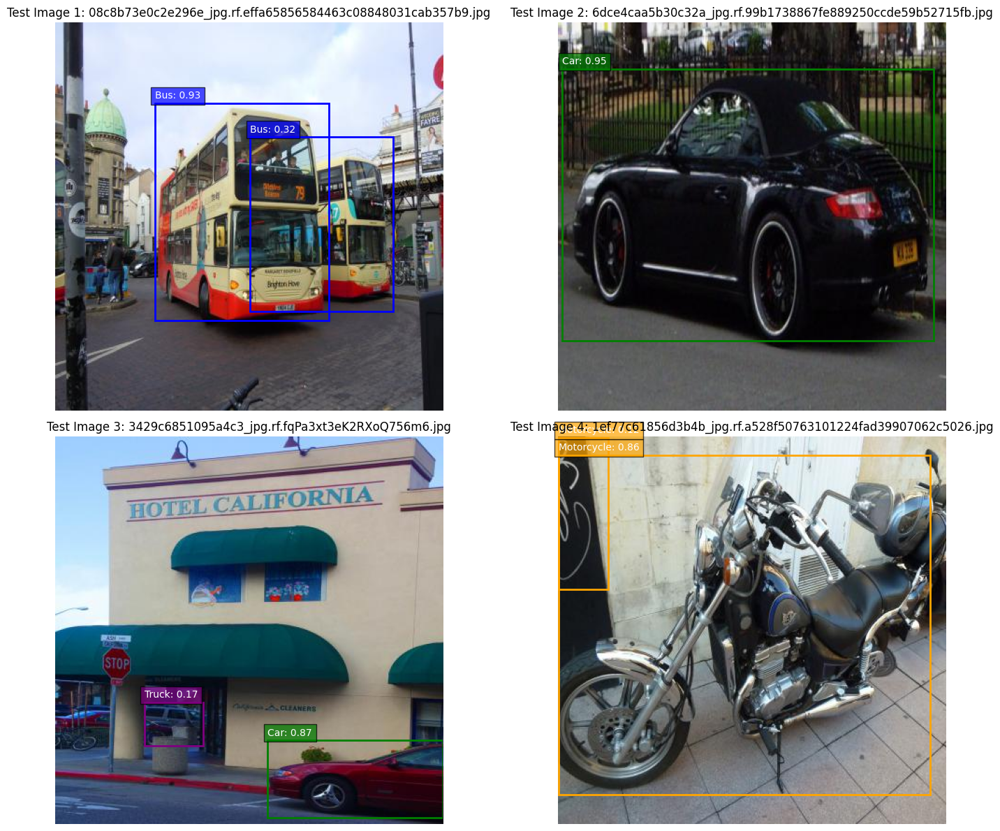

In [37]:
visualize_predictions(model, test_img_dir)

# Accuracy

In [63]:
# Cell 12: Detailed evaluation with confusion matrix
def evaluate_detailed(model, test_dataset, conf_threshold=0.1, iou_threshold=0.5):
    """Perform detailed evaluation including confusion matrix"""
    all_true_labels = []
    all_pred_labels = []

    print("Performing detailed evaluation...")

    try:
        for i in tqdm(range(len(test_dataset))):
            sample = test_dataset[i]
            img_path = sample['image_path']
            gt_boxes = sample['boxes'].numpy()
            gt_classes = sample['classes'].numpy()

            # Skip empty ground truth
            if len(gt_boxes) == 0:
                continue

            # Make prediction
            results = model(img_path, conf=conf_threshold)
            pred_boxes = results[0].boxes.xyxy.cpu().numpy()

            # Skip if no predictions
            if len(pred_boxes) == 0:
                for gt_idx, gt_class in enumerate(gt_classes):
                    all_true_labels.append(gt_class)
                    all_pred_labels.append(-1)  # -1 indicates no prediction matched
                continue

            pred_classes = results[0].boxes.cls.cpu().numpy().astype(int)
            pred_scores = results[0].boxes.conf.cpu().numpy()

            # Match predictions to ground truth
            matched_gt = set()
            matched_pred = set()

            # Create IoU matrix between all gt and pred boxes
            for gt_idx, gt_box in enumerate(gt_boxes):
                for pred_idx, pred_box in enumerate(pred_boxes):
                    iou = calculate_iou(gt_box, pred_box)

                    if iou >= iou_threshold and pred_idx not in matched_pred and gt_idx not in matched_gt:
                        matched_gt.add(gt_idx)
                        matched_pred.add(pred_idx)

                        all_true_labels.append(gt_classes[gt_idx])
                        all_pred_labels.append(pred_classes[pred_idx])

            # Add false positives
            for pred_idx, pred_class in enumerate(pred_classes):
                if pred_idx not in matched_pred:
                    all_true_labels.append(-1)  # -1 indicates no matching ground truth
                    all_pred_labels.append(pred_class)

            # Add false negatives
            for gt_idx, gt_class in enumerate(gt_classes):
                if gt_idx not in matched_gt:
                    all_true_labels.append(gt_class)
                    all_pred_labels.append(-1)  # -1 indicates no prediction matched

        # Create confusion matrix for matching predictions (excluding FP and FN)
        valid_mask = (np.array(all_true_labels) != -1) & (np.array(all_pred_labels) != -1)
        valid_true = np.array(all_true_labels)[valid_mask]
        valid_pred = np.array(all_pred_labels)[valid_mask]

        if len(valid_true) == 0 or len(valid_pred) == 0:
            print("No valid prediction matches found for confusion matrix.")
            return None

        # Calculate confusion matrix
        cm = confusion_matrix(valid_true, valid_pred, labels=list(range(len(class_mapping))))

        # Plot confusion matrix
        plt.figure(figsize=(10, 8))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                    xticklabels=list(class_mapping.values()),
                    yticklabels=list(class_mapping.values()))
        plt.title('Confusion Matrix')
        plt.xlabel('Predicted')
        plt.ylabel('True')
        plt.tight_layout()
        plt.show()

         # Bar chart: Ground truth vs Predictions per class
        true_counts = [all_true_labels.count(cls_id) for cls_id in class_mapping.keys()]
        pred_counts = [all_pred_labels.count(cls_id) for cls_id in class_mapping.keys()]

        x_labels = list(class_mapping.values())
        x = np.arange(len(x_labels))
        width = 0.35

        plt.figure(figsize=(10, 6))
        plt.bar(x - width/2, true_counts, width, label='Ground Truth', color='skyblue')
        plt.bar(x + width/2, pred_counts, width, label='Predicted', color='salmon')
        plt.xlabel('Class')
        plt.ylabel('Count')
        plt.title('Ground Truth vs Predicted Labels per Class')
        plt.xticks(x, x_labels, rotation=45)
        plt.legend()
        plt.tight_layout()
        plt.show()

        # Calculate metrics
        results = {
            'per_class': {},
            'overall': {}
        }

        # Per-class metrics
        total_support = 0
        macro_precision = 0
        macro_recall = 0
        macro_f1 = 0

        for class_id in range(len(class_mapping)):
            # Calculate TP, FP, FN for each class
            tp = cm[class_id, class_id] if class_id < cm.shape[0] and class_id < cm.shape[1] else 0
            fp = cm[:, class_id].sum() - tp if class_id < cm.shape[1] else 0
            fn = cm[class_id, :].sum() - tp if class_id < cm.shape[0] else 0
            support = tp + fn

            # Calculate metrics
            precision = tp / max(tp + fp, 1)
            recall = tp / max(tp + fn, 1)
            f1 = 2 * (precision * recall) / max(precision + recall, 1e-10)

            results['per_class'][class_id] = {
                'precision': precision,
                'recall': recall,
                'f1-score': f1,
                'support': support
            }

            # Accumulate for macro average
            macro_precision += precision
            macro_recall += recall
            macro_f1 += f1
            total_support += support

        # Calculate macro average
        num_classes = len(results['per_class'])
        results['overall'] = {
            'accuracy': np.sum([cm[i,i] for i in range(min(cm.shape[0], cm.shape[1]))]) / total_support if total_support > 0 else 0,
            'macro avg': {
                'precision': macro_precision / num_classes,
                'recall': macro_recall / num_classes,
                'f1-score': macro_f1 / num_classes,
                'support': total_support
            }
        }

        # Print evaluation report
        print_evaluation_report(results)

        return results

    except Exception as e:
        print(f"Error in detailed evaluation: {e}")
        import traceback
        traceback.print_exc()
        print("\nFailed to complete detailed evaluation. Please check the dataset and model.")
        return None

def print_evaluation_report(results):
    """Print formatted evaluation report"""
    headers = ['', 'precision', 'recall', 'f1-score', 'support']
    rows = []

    for class_id, metrics in results['per_class'].items():
        class_name = class_mapping[class_id]
        rows.append([
            class_name,
            f"{metrics['precision']:.2f}",
            f"{metrics['recall']:.2f}",
            f"{metrics['f1-score']:.2f}",
            f"{metrics['support']}"
        ])

    rows.append([
        'accuracy',
        '',
        '',
        f"{results['overall']['accuracy']:.2f}",
        f"{results['overall']['macro avg']['support']}"
    ])

    macro = results['overall']['macro avg']
    rows.append([
        'macro avg',
        f"{macro['precision']:.2f}",
        f"{macro['recall']:.2f}",
        f"{macro['f1-score']:.2f}",
        f"{macro['support']}"
    ])

    print(tabulate(rows, headers=headers, floatfmt='.2f'))

Performing detailed evaluation...


  0%|          | 0/126 [00:00<?, ?it/s]


image 1/1 /content/drive/MyDrive/Car_Detection/test/images/00dea1edf14f09ab_jpg.rf.3f17c8790a68659d03b1939a59ccda80.jpg: 640x640 1 Ambulance, 1 Truck, 43.4ms
Speed: 2.8ms preprocess, 43.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/drive/MyDrive/Car_Detection/test/images/00dea1edf14f09ab_jpg.rf.KJ730oDTFPdXdJxvSLnX.jpg: 640x640 1 Ambulance, 1 Truck, 43.2ms
Speed: 2.5ms preprocess, 43.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/drive/MyDrive/Car_Detection/test/images/00e481ea1a520175_jpg.rf.6e6a8b3b45c9a11d106958f88ff714ea.jpg: 640x640 4 Buss, 42.9ms
Speed: 2.5ms preprocess, 42.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/drive/MyDrive/Car_Detection/test/images/00e481ea1a520175_jpg.rf.MV6sZ8QCFwFeMYaI2tHm.jpg: 640x640 4 Buss, 43.2ms
Speed: 2.3ms preprocess, 43.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/drive/My

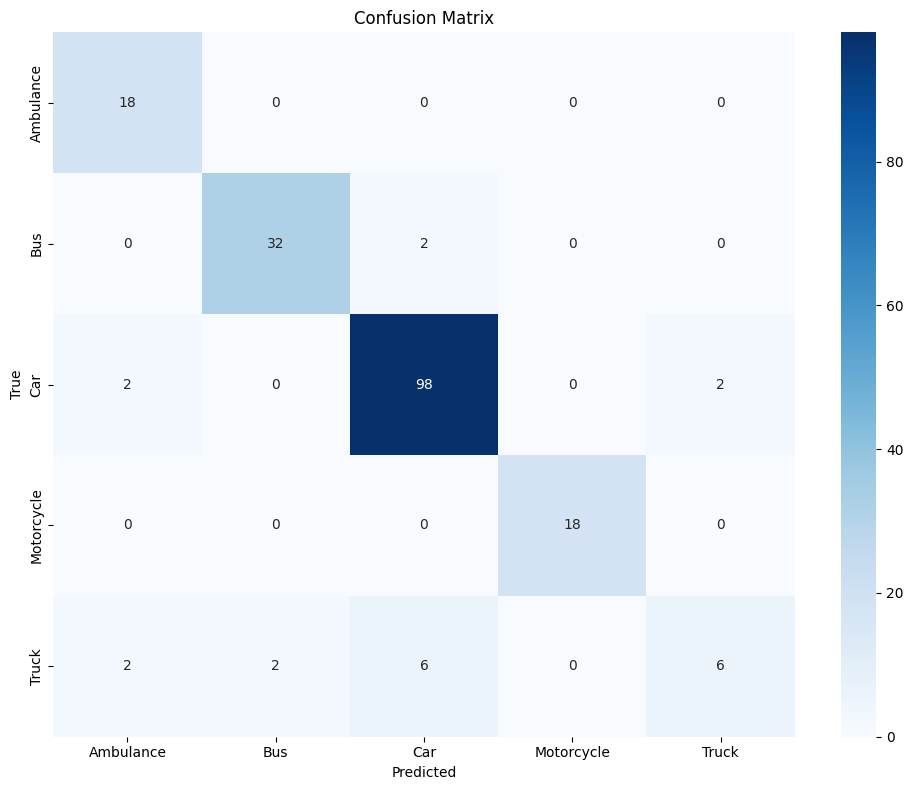

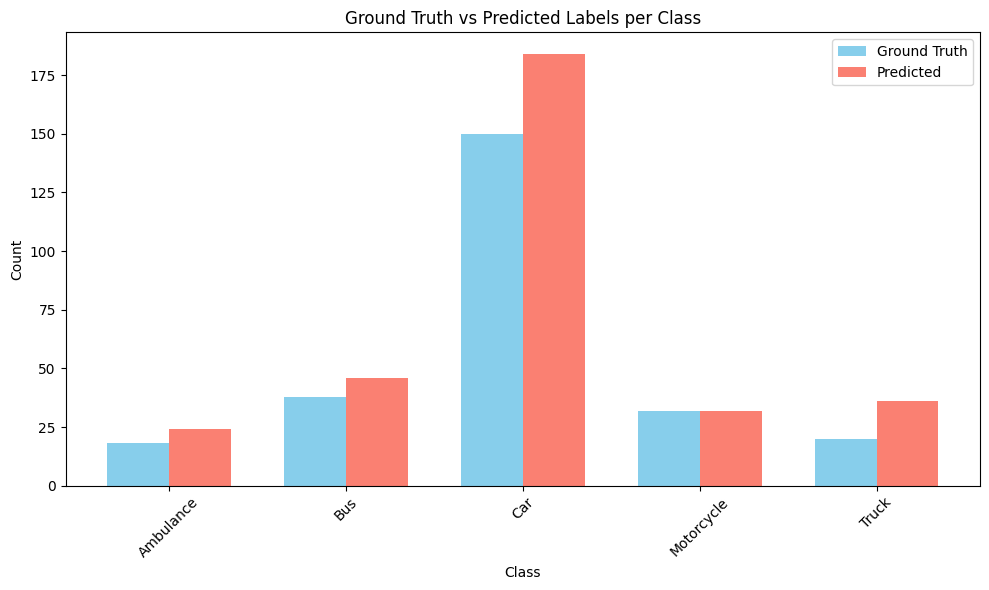

            precision    recall      f1-score    support
----------  -----------  --------  ----------  ---------
Ambulance   0.82         1.00            0.90         18
Bus         0.94         0.94            0.94         34
Car         0.92         0.96            0.94        102
Motorcycle  1.00         1.00            1.00         18
Truck       0.75         0.38            0.50         16
accuracy                                 0.91        188
macro avg   0.89         0.86            0.86        188


In [64]:
detailed_results = evaluate_detailed(model, test_dataset)

# Prediction New Data

In [49]:
import os
import cv2
import torch
import matplotlib.pyplot as plt

# Mapping class ID ke nama
class_mapping = {
    0: 'Ambulance',
    1: 'Bus',
    2: 'Car',
    3: 'Motorcycle',
    4: 'Truck'
}

# Warna untuk masing-masing kelas
class_colors = {
    0: 'red',
    1: 'blue',
    2: 'green',
    3: 'orange',
    4: 'purple'
}

# Fungsi NMS (gunakan built-in dari Torch jika belum punya)
def apply_nms(boxes, scores, classes, iou_threshold=0.5):
    if boxes.numel() == 0:
        return []

    boxes_np = boxes.cpu()
    scores_np = scores.cpu()

    keep = torch.ops.torchvision.nms(boxes_np, scores_np, iou_threshold)
    return keep


# Fungsi untuk analisis gambar tunggal
def analyze_single_image(model, image_path, conf_threshold=0.25, iou_threshold=0.5):
    """Analyze a single image and count detections by class."""
    try:
        if not os.path.exists(image_path):
            print(f"Error: Image file not found at {image_path}")
            return None

        # Counter deteksi awal
        detections_count = {class_id: 0 for class_id in class_mapping.keys()}

        # Run prediction
        results = model(image_path, conf=conf_threshold)
        original_boxes = results[0].boxes

        boxes = original_boxes.xyxy
        scores = original_boxes.conf
        classes = original_boxes.cls

        # Skip jika tidak ada deteksi
        if boxes is None or len(boxes) == 0:
            print("No detections found in the image.")
            img = cv2.imread(image_path)
            if img is not None:
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                plt.figure(figsize=(12, 10))
                plt.imshow(img)
                plt.title(f"No detections: {os.path.basename(image_path)}")
                plt.axis('off')
                plt.show()
            return detections_count

        # Apply NMS
        keep_indices = apply_nms(boxes, scores, classes, iou_threshold)

        filtered_boxes = boxes[keep_indices]
        filtered_scores = scores[keep_indices]
        filtered_classes = classes[keep_indices]

        # Load image
        img = cv2.imread(image_path)
        if img is None:
            print(f"Warning: Could not read image at {image_path}")
            return detections_count
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # Tampilkan gambar dan bounding box
        plt.figure(figsize=(12, 10))
        plt.imshow(img)

        for i in range(len(filtered_boxes)):
            x1, y1, x2, y2 = filtered_boxes[i].cpu().numpy()
            cls_id = int(filtered_classes[i].item())
            conf = filtered_scores[i].item()

            # Tambahkan count deteksi
            if cls_id in detections_count:
                detections_count[cls_id] += 1

            # Pilih warna berdasarkan kelas
            color = class_colors.get(cls_id, 'yellow')

            # Gambar bounding box
            rect = plt.Rectangle((x1, y1), x2 - x1, y2 - y1,
                                 fill=False, edgecolor=color, linewidth=2)
            plt.gca().add_patch(rect)

            # Tambahkan label
            label = f"{class_mapping.get(cls_id, 'Unknown')}: {conf:.2f}"
            plt.text(x1, y1 - 5, label, color='white', fontsize=10,
                     bbox=dict(facecolor=color, alpha=0.6))

        plt.title(f"Vehicle Detection Results: {os.path.basename(image_path)}")
        plt.axis('off')
        plt.tight_layout()
        plt.show()

        # Print info
        print(f"\nDetections before NMS: {len(boxes)}")
        print(f"Detections after NMS: {len(filtered_boxes)}")

        # Print count per class
        for class_id, count in detections_count.items():
            print(f"{class_mapping[class_id]}: {count}")

        return detections_count

    except Exception as e:
        print(f"Error analyzing image: {e}")
        import traceback
        traceback.print_exc()
        return None



image 1/1 /content/test.jpeg: 448x640 2 Cars, 1 Motorcycle, 36.6ms
Speed: 3.7ms preprocess, 36.6ms inference, 2.1ms postprocess per image at shape (1, 3, 448, 640)


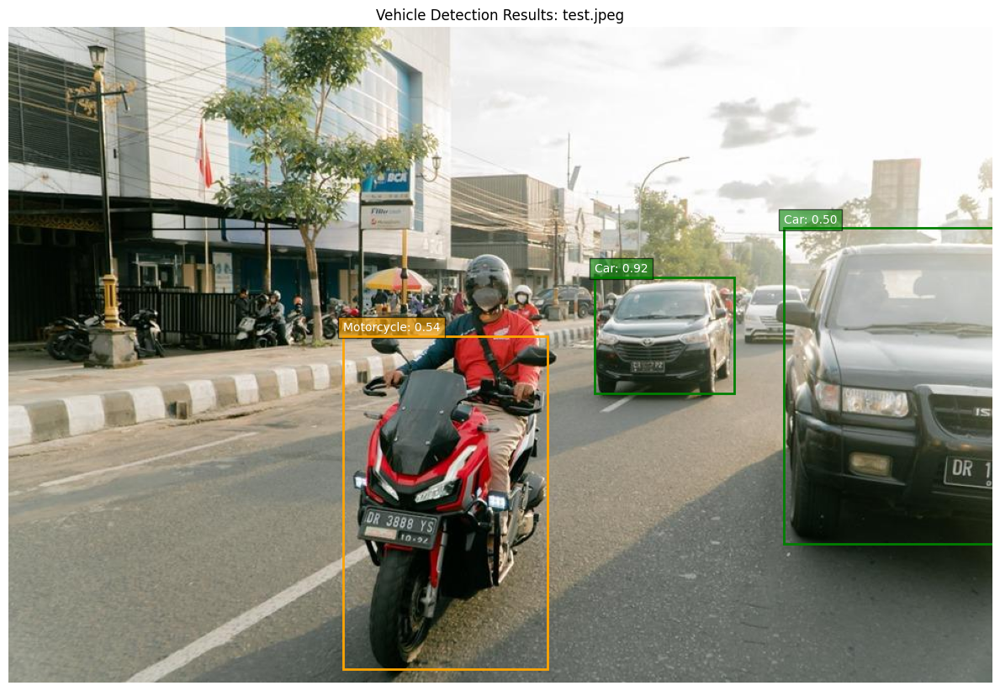


Detections before NMS: 3
Detections after NMS: 3
Ambulance: 0
Bus: 0
Car: 2
Motorcycle: 1
Truck: 0


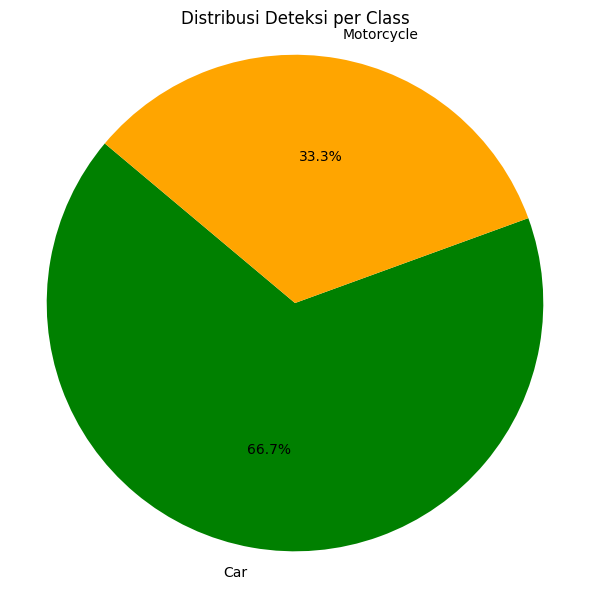

In [62]:
# ===== PIE CHART OF DETECTION =====
import matplotlib.pyplot as plt

# Call the analysis function and store the result
detection_counts = analyze_single_image(model, test_image_path)

# Ambil hanya class yang terdeteksi
detected_classes = {k: v for k, v in detection_counts.items() if v > 0}

if detected_classes:
    # Access the class_mapping and class_colors from the global scope
    global class_mapping, class_colors

    labels = [class_mapping[cls_id] for cls_id in detected_classes.keys()]
    sizes = [detected_classes[cls_id] for cls_id in detected_classes.keys()]
    colors = [class_colors.get(cls_id, 'gray') for cls_id in detected_classes.keys()]

    # Plot pie chart
    plt.figure(figsize=(6, 6))
    plt.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%', startangle=140)
    plt.title("Distribusi Deteksi per Class")
    plt.axis('equal')  # Equal aspect ratio untuk pie chart yang bulat
    plt.tight_layout()
    plt.show()
else:
    print("Tidak ada deteksi yang bisa ditampilkan dalam pie chart.")

In [52]:
def analyze_multiple_images(model, image_paths, conf_threshold=0.25, iou_threshold=0.5):
    """
    Analyze multiple images and provide an overall summary
    with Non-Maximum Suppression (NMS) applied.
    """
    try:
        if not image_paths:
            print("Error: No image paths provided.")
            return None

        # Filter hanya path gambar yang valid
        valid_paths = [path for path in image_paths if os.path.exists(path)]
        if not valid_paths:
            print("Error: No valid image paths found.")
            return None

        print(f"\nAnalyzing {len(valid_paths)} image(s) with NMS...")

        # Inisialisasi hasil akumulasi
        accumulated_detections = {class_id: 0 for class_id in class_mapping.keys()}

        # Loop melalui semua gambar
        for idx, image_path in enumerate(valid_paths):
            print(f"\n[Image {idx+1}/{len(valid_paths)}] - {os.path.basename(image_path)}")
            detections = analyze_single_image(model, image_path, conf_threshold, iou_threshold)

            if detections:
                for class_id, count in detections.items():
                    accumulated_detections[class_id] += count
            else:
                print(f"Warning: No results from image {os.path.basename(image_path)}")

        # Ringkasan hasil
        print("\n" + "="*50)
        print("🔍 OVERALL ANALYSIS SUMMARY")
        print("="*50)
        print(f"Total images analyzed: {len(valid_paths)}")
        for class_id, count in accumulated_detections.items():
            print(f"- {class_mapping[class_id]}: {count}")
        print("="*50)

        return accumulated_detections

    except Exception as e:
        print(f"Error during multiple image analysis: {e}")
        import traceback
        traceback.print_exc()
        return None


In [53]:
# Cell 16: User upload function for Google Colab
def process_user_uploads(model, image_paths=None, conf_threshold=0.1, iou_threshold=0.5):
    """Process user uploaded images or use provided image paths"""
    try:
        import os
        from google.colab import files

        if image_paths is not None and len(image_paths) > 0:
            # If paths are directly provided, use them
            print(f"Processing {len(image_paths)} provided images...")
            for path in image_paths:
                print(f"Image path: {os.path.basename(path) if isinstance(path, str) else path}")

            return analyze_multiple_images(
                model,
                image_paths,
                conf_threshold,
                iou_threshold
            )
        else:
            # Create a temporary directory to store uploaded files
            import tempfile
            temp_dir = tempfile.mkdtemp()
            print(f"Created temporary directory: {temp_dir}")

            # Use Google Colab's built-in file uploader
            print("Please upload image files for acne analysis...")
            try:
                uploaded = files.upload()

                if not uploaded:
                    print("No files were uploaded.")
                    return None, 0, "No data"

                # Process uploaded files
                file_paths = []

                # Save uploaded files to temp directory
                for filename, content in uploaded.items():
                    temp_path = os.path.join(temp_dir, filename)

                    try:
                        with open(temp_path, 'wb') as f:
                            f.write(content)
                        file_paths.append(temp_path)
                        print(f"Saved {filename} to {temp_path}")
                    except Exception as e:
                        print(f"Error saving {filename}: {e}")

                # Process uploaded images
                print(f"Processing {len(file_paths)} images...")

                results = None, 0, "No data"
                if file_paths:
                    results = analyze_multiple_images(
                        model,
                        file_paths,
                        conf_threshold,
                        iou_threshold
                    )

                # Clean up temporary files
                for path in file_paths:
                    try:
                        os.remove(path)
                        print(f"Removed temporary file: {path}")
                    except Exception as e:
                        print(f"Error removing {path}: {e}")
                try:
                    os.rmdir(temp_dir)
                    print(f"Removed temporary directory: {temp_dir}")
                except Exception as e:
                    print(f"Error removing directory {temp_dir}: {e}")

                return results
            except Exception as e:
                print(f"Error during file upload: {e}")
                import traceback
                traceback.print_exc()
                return None, 0, "Error"
    except Exception as e:
        print(f"Error in process_user_uploads: {e}")
        import traceback
        traceback.print_exc()
        return None, 0, "Error"

Upload images for analysis:
Created temporary directory: /tmp/tmp8jnw01wb
Please upload image files for acne analysis...


Saving Screenshot 2025-06-28 120932.png to Screenshot 2025-06-28 120932.png
Saved Screenshot 2025-06-28 120932.png to /tmp/tmp8jnw01wb/Screenshot 2025-06-28 120932.png
Processing 1 images...

Analyzing 1 image(s) with NMS...

[Image 1/1] - Screenshot 2025-06-28 120932.png

image 1/1 /tmp/tmp8jnw01wb/Screenshot 2025-06-28 120932.png: 480x640 2 Ambulances, 2 Cars, 117.2ms
Speed: 2.4ms preprocess, 117.2ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)


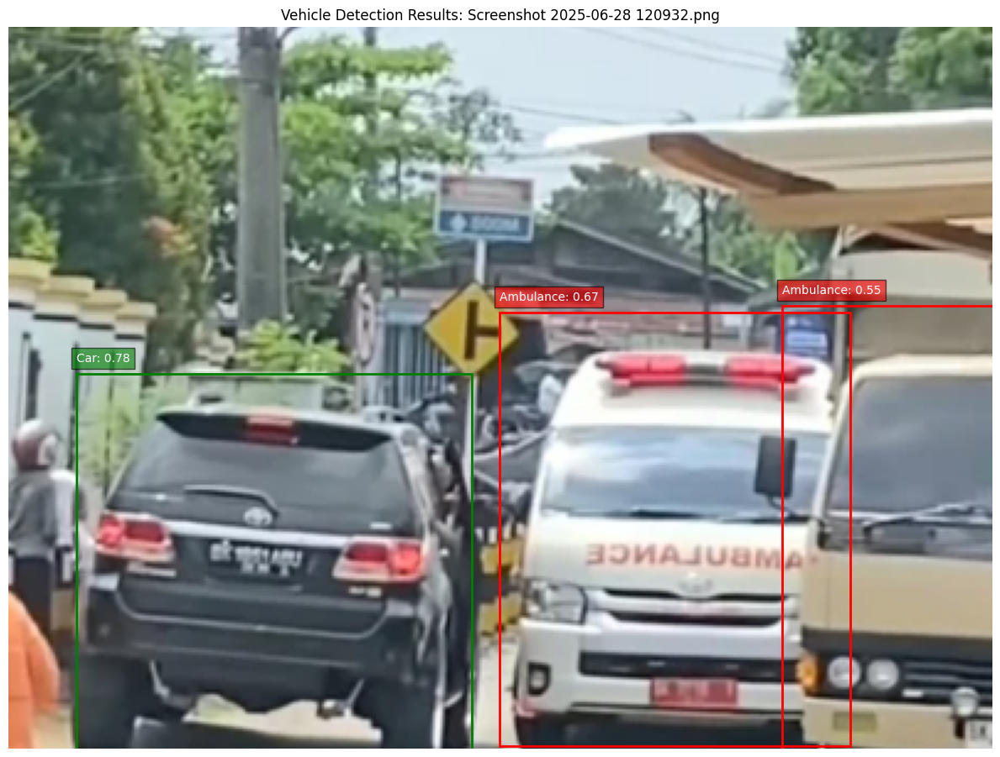


Detections before NMS: 4
Detections after NMS: 3
Ambulance: 2
Bus: 0
Car: 1
Motorcycle: 0
Truck: 0

🔍 OVERALL ANALYSIS SUMMARY
Total images analyzed: 1
- Ambulance: 2
- Bus: 0
- Car: 1
- Motorcycle: 0
- Truck: 0
Removed temporary file: /tmp/tmp8jnw01wb/Screenshot 2025-06-28 120932.png
Removed temporary directory: /tmp/tmp8jnw01wb


{0: 2, 1: 0, 2: 1, 3: 0, 4: 0}

In [54]:
print("Upload images for analysis:")
process_user_uploads(model)